In [1]:
import numpy as np
import random
import time
import math
import random
import os
import sys
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import xlwt


# Notebook path
current_directory = os.getcwd()
# Get one behind for calling the other modules
root_directory = os.path.abspath(os.path.join(current_directory, '..'))
sys.path.append(root_directory)

#Network and measures
from to_get_data.net_construction_vis_measures import *

#from to_get_data.generate_database import *
#Agrobiodiversity
from to_get_data.agrobiodiversity_data import *

from model_class.Variety import Variety
from model_class.UD import *

In [11]:
class UD_dual_organization:
    ## CLase UD_dual_organization
    ## IMPORTANT: The class "select_new_ud" is the one that applies the weight according to clan and community. 
    ## The weight can be changed to represent a spectrum of exogamy rules. It means how much importance do you give
    ## To the clan or community differences
    uds = {}

    def __init__(self, id_ud, media, community, clan, f_clan = 0, m_clan = 0):
        self.id = id_ud
        self.parentes = [None]*10
        self.age = 1
        self.filhos = [None] * (np.random.poisson(media))
        self.activa = True 
        self.varieties = []
        self.community = community
        self.clan = clan
        self.uds[id_ud] = self
        self.female = [id_ud, f_clan]
        self.male = [id_ud + 1, m_clan]
        

    def ter_filho(self):
        # Tem espaco para ter filhos?, aleatoriamente para nao ter filhos todo ano. 
        if None in self.filhos and random.random() <= 0.3:
            # Coloca o filho no primeiro None
            for i in range(len(self.filhos)):
                if self.filhos[i] is None:
                    self.filhos[i] = [random.choice([0, 1]), 0] #[sexo, idade] e no sexo: 0 é feminino e 1 é masculino
                    break
        else:
            pass #print(f"Unidade {self.id} No tem para ter filhos!")

    def incrementar_idade(self):
        self.age += 1
        ## idade dos filhos no self.filhos
        for i in range(len(self.filhos)):
            if self.filhos[i] is not None:
                self.filhos[i][1] += 1
            else:
                break

    def death_probability(self, beta):
        alpha = 0.01
        delta = 0.00
        mortality_rate = alpha * math.exp(beta * (self.age)) + delta

        if random.random() < mortality_rate:
            self.activa = False

    def buscar_ud(self, media, matrilinear, locality, inheritance): #To look and reproduce

        #Media: Mean of children for a Possion distribution
        #Matrilinear: determine the percentage of varieties that are going to pass to the next generation
        #Locality: True= Matrilocal, False=Patrilocal
        #Inheritance: True = Matrilinear, False= Patrilinear 
        
        #Function to get a random couple       
        def select_new_ud (selected_ud, uds_disponiveis): #selected_ud es un objeto ud
            peso_clan, pes_com = 0.8 , 0.2
            if len(uds_disponiveis) != 0: #If there are possible mates
                probabilidad = np.zeros(len(uds_disponiveis))
                for i, obj in enumerate(uds_disponiveis):
                    clan_val = 0.1 if obj.clan == selected_ud.clan else 0.9
                    com_val = 0.9 if obj.community == selected_ud.community else 0.1
                    probabilidad[i] = clan_val*peso_clan + com_val*pes_com
                probabilidad = probabilidad / np.sum(probabilidad)
                choosen_ud = np.random.choice(uds_disponiveis, p=probabilidad)    
                return choosen_ud
            else:
                return False
        
        #Função para facilitar a busqueda de ids dentro da lista de parentes.
        def is_id_in_nested_lists(id_ud, nested_list):
            if id_ud in nested_list:
                return True
            for sublist in nested_list:
                if isinstance(sublist, list) and is_id_in_nested_lists(id_ud, sublist):
                    return True
            return False
        
        #Função para facilitar a busqueda de filhos segundo o sexo
        def filho_e_idade(self, sexo):
            for i in range(len(self.filhos)):
                filho = self.filhos[i]
                #Se o sexo é o que estamos procurando e se a idade é permitida para o casamento
                if filho is not None and filho[0] == sexo and filho[1] > 13:
                    return (True, i, filho[1])  # True, a posição e a idade

            return (False, None, None)  # False, None e None
        
        filha_disponivel, posição_filha, idade_filha = filho_e_idade(self, 0) #Se a unidade tem uma filha disponivel para procurar esposa
        if filha_disponivel:
            uds_disponiveis = [ud for id_ud, ud in self.uds.items() if
                    id_ud != self.id and #Que a UD não seja self
                    not is_id_in_nested_lists(id_ud, [self.parentes[i] for i in [0, 1, 2, 3, 7]]) and # Que a UD não seja um parent
                    filho_e_idade(ud,1)[0] and #Que tenha um filho
                    abs(filho_e_idade(ud,1)[2] - idade_filha) <= 15 #Que a diferença entre as idades não seja maior a 10
                      ]
            new_couple = select_new_ud(self, uds_disponiveis)
            
            if new_couple:
                cassal_id = new_couple.id
                filho_disponivel, posição_filho, idade_filho = filho_e_idade(UD_dual_organization.uds[cassal_id], 1)
                #print(filho_disponivel, posição_filho, idade_filho)
                #Agregar no espaço de casais passados [9]
                if self.parentes[9] is None: 
                    # Se a lista não existe, cria uma nova com esse id
                    self.parentes[9] = [cassal_id]
                else:
                    # Se a lista já existe, só agrega o id
                    self.parentes[9].append(cassal_id)
                if self.uds[cassal_id].parentes[9] is None: 
                    # Se a lista não existe, cria uma nova com esse id
                    self.uds[cassal_id].parentes[9] = [self.id]
                else:
                    # Se a lista já existe, só agrega o id
                    self.uds[cassal_id].parentes[9].append(self.id)   

                #### Criar um novo filho e asignar os parentes
                novo_id = max(self.uds) + 2
                #Locality: True= Matrilocal, False=Patrilocal
                #Inheritance: True = Matrilinear, False= Patrilinear 
                if locality == True:
                    if inheritance == True:
                        novo_nodo = UD_dual_organization(novo_id, media, self.community, self.clan, self.clan, self.uds[cassal_id].clan) # Matrilocal and matrilineal
                    else:
                        novo_nodo = UD_dual_organization(novo_id, media, self.community, self.uds[cassal_id].clan, self.clan, self.uds[cassal_id].clan) # Matrilocal and patrilineal
                else:
                    if inheritance == True:
                        novo_nodo = UD_dual_organization(novo_id, media, self.uds[cassal_id].community, self.clan, self.clan, self.uds[cassal_id].clan) # Patrilocal and matrilineal
                    else:
                        novo_nodo = UD_dual_organization(novo_id, media, self.uds[cassal_id].community, self.uds[cassal_id].clan, self.clan, self.uds[cassal_id].clan) # Patrilocal and patrilineal
                novo_nodo.parentes[1] = self.id   # Familia materna [0]
                novo_nodo.parentes[0] = cassal_id # Familia paterna [1] 
                
                #####Avos[3]
                # IDs maternos
                padre_self = self.parentes[0]
                madre_self = self.parentes[1]
                # IDs paternos
                pareja = self.uds[cassal_id]
                padre_pareja = pareja.parentes[0]
                madre_pareja = pareja.parentes[1]
                # Agregar os pais dos pais do novo_nodo como avos
                novo_nodo.parentes[3] = [valor for valor in [padre_self, madre_self, padre_pareja, madre_pareja] if valor is not None]
                ###Proceso de atualização: netos
                # Se novo_nodo tem avos 
                if None not in novo_nodo.parentes[3]:
                    # IDs dos avos de novo_nodo
                    abuelos_ids = novo_nodo.parentes[3]
                # Agregar aos avos o novo_nodo como neto.
                for abuelo_id in abuelos_ids:
                    if abuelo_id is not None:
                        abuelo = self.uds[abuelo_id]
                        if abuelo.parentes[7] is None:
                            abuelo.parentes[7] = [novo_nodo.id]
                        else:
                            abuelo.parentes[7].append(novo_nodo.id)
                
                #### Irmãos [4]
                hermanos_ids = []
                if novo_nodo.parentes[0] is not None:
                    # Filhos dos pais do novo_nodo (irmãos por parte do pai)
                    padre_nuevo = self.uds[novo_nodo.parentes[0]]
                    if padre_nuevo.parentes[2] is not None:
                        hermanos_ids.extend(padre_nuevo.parentes[2])
                if novo_nodo.parentes[1] is not None:
                    # Filhos dos pais do novo_nodo (irmãos por parte da mãe)
                    madre_nuevo = self.uds[novo_nodo.parentes[1]]
                    if madre_nuevo.parentes[2] is not None:
                        hermanos_ids.extend(madre_nuevo.parentes[2])
                # Não ter o id de novo_nodo como irmão
                hermanos_ids = [hermano_id for hermano_id in hermanos_ids if hermano_id != novo_nodo.id]
                # Agregar aos irmãos de novo_nodo
                novo_nodo.parentes[4] = hermanos_ids
                
                ##Proceso de atualização: irmãos
                # ID de novo_nodo nos irmãos existentes
                for hermano_id in hermanos_ids:
                    hermano = self.uds[hermano_id]
                    if hermano.parentes[4] is None:
                        hermano.parentes[4] = [novo_nodo.id]
                    else:
                        hermano.parentes[4].append(novo_nodo.id)
                #####Tios[5]
                # IDs dos avos de novo_nodo
                abuelos_ids = novo_nodo.parentes[3]
                
                # Iterar nos avos para encontrar os tios
                tios_ids = [hermano_id for abuelo_id in abuelos_ids if abuelo_id is not None
                            for hermano_id in self.uds[abuelo_id].parentes[2] if hermano_id is not None
                            if hermano_id != novo_nodo.parentes[0] and hermano_id != novo_nodo.parentes[1]]
                # Agregar os IDs dos tios no novo_nodo
                novo_nodo.parentes[5] = tios_ids
                
                ##Proceso de atualização: sobrinhos
                # Actualizar os sobrinhos dos tios.
                for tio_id in tios_ids:
                    if tio_id is not None:
                        tio = self.uds[tio_id]
                        if tio.parentes[8] is None:
                            # Se não existe, cria lisa com o id de novo_nodo
                            tio.parentes[8] = [novo_nodo.id]
                        else:
                            # Se existe, agregar o id de novo_nodo
                            tio.parentes[8].append(novo_nodo.id)
                
                #### Primos[6]
                primos_ids = [primo_id for tio_id in tios_ids if tio_id is not None
                            for tio in [self.uds[tio_id]] if tio.parentes[2] is not None
                            for primo_id in tio.parentes[2] if primo_id is not None and primo_id != novo_nodo.id]

                # Agregar os IDs dos primos no novo_nodo
                novo_nodo.parentes[6] = primos_ids
                
                ##Proceso de atualização: sobrinhos
                for primo_id in primos_ids:
                    if primo_id is not None:
                        primo = self.uds[primo_id]
                        if primo.parentes[6] is None:
                            # Se não existe, cria lisa com o id de novo_nodo
                            primo.parentes[6] = [novo_nodo.id]
                        else:
                            # Se existe, agregar o id de novo_nodo
                            primo.parentes[6].append(novo_nodo.id)
                            
                ####Sobrinos[8] 
                sobrinos_ids = [sobrino_id for hermano_id in hermanos_ids if hermano_id is not None
                                for hermano in [self.uds[hermano_id]] if hermano.parentes[2] is not None
                                for sobrino_id in hermano.parentes[2] if sobrino_id is not None and sobrino_id != novo_nodo.id]

                # Agregar os IDs dos sobrinhos no novo_nodo
                novo_nodo.parentes[8] = sobrinos_ids
                
                ##Proceso de atualização: tios
                for sobrino_id in sobrinos_ids:
                    if sobrino_id is not None:
                        sobrino = self.uds[sobrino_id]
                        if sobrino.parentes[5] is None:
                            # Se não existe, cria lisa com o id de novo_nodo
                            sobrino.parentes[5] = [novo_nodo.id]
                        else:
                            # Se existe, agregar o id de novo_nodo
                            sobrino.parentes[5].append(novo_nodo.id)
                            
                            
                ### Eliminar os filhos utilizados no processo
                self.filhos.pop(posição_filha)
                self.uds[cassal_id].filhos.pop(posição_filho)
                
                # colcoar o novo filho dos pais
                if self.parentes[2] is None:
                    self.parentes[2] = [novo_id]
                else:
                    self.parentes[2].append(novo_id)
                if self.uds[cassal_id].parentes[2] is None:
                    self.uds[cassal_id].parentes[2] = [novo_id]
                else:
                    self.uds[cassal_id].parentes[2].append(novo_id)
                
                # Herdar sementes
                novo_nodo.inherit(matrilinear)
                
                #return None
            else:
                #print(f"UD {self.id} não achou cassal.")
                return None

        else:
            #print(f"UD {self.id} não achou ninguem")
            return None

    def inherit(self, matrilinear): #Metodo da herança de sementes.
        vm = UD_dual_organization.uds[self.parentes[1]].varieties
        vp = UD_dual_organization.uds[self.parentes[0]].varieties
        heredar_mae = math.ceil((matrilinear * len(vm))/100)
        heredar_pai = math.ceil(((100-matrilinear) * len(vp))/100)
        vari_mae = vm[0:heredar_mae] #as primeiras variedades
        vari_pai = vp[0:heredar_pai] #as primeiras variedades
        # Heredar as variedades
        self.varieties.extend(vari_mae + vari_pai)

In [2]:
def generate_puck(uds, clan = False):
    if clan == False:
        puck_dataset_individuals = []
        puck_dataset_families = []
        for ud in uds.values():
            id_female = ud.female[0]
            name_female = f" F {ud.female[0]}"
            gender_female = "F"
            puck_dataset_individuals.append([id_female, name_female, gender_female])
            id_male = ud.male[0]
            name_male = f" H {ud.male[0]}"
            gender_male = "H"
            puck_dataset_individuals.append([id_male, name_male, gender_male])


            id_family = ud.id
            Status = "M"
            FatherID = ud.male[0]
            MotherID = ud.female[0]
            Children = ';'.join(map(str, ud.parentes[2])) if ud.parentes[2] != None else ''            
            puck_dataset_families.append([id_family, "M", FatherID, MotherID, Children])

        df_individuals = pd.DataFrame(puck_dataset_individuals, columns=["ID", "Name", "Gender"])
        df_families = pd.DataFrame(puck_dataset_families, columns=["ID", "Status", 'FatherId', "MotherId", "Children"])
        return df_individuals, df_families
    else:
        puck_dataset_individuals = []
        puck_dataset_families = []
        for ud in uds.values():
            id_female = ud.female[0]
            clan_female = ud.female[1]
            name_female = f" F {ud.female[0]}"
            gender_female = "F"
            puck_dataset_individuals.append([id_female, name_female, gender_female, clan_female])
            id_male = ud.male[0]
            clan_male = ud.male[1]
            name_male = f" H {ud.male[0]}"
            gender_male = "H"
            puck_dataset_individuals.append([id_male, name_male, gender_male, clan_male])
            id_family = ud.id
            Status = "M"
            FatherID = ud.male[0]
            MotherID = ud.female[0]
            Children = ';'.join(map(str, ud.parentes[2])) if ud.parentes[2] != None else ''
            puck_dataset_families.append([id_family, "M", FatherID, MotherID, Children])

        df_individuals = pd.DataFrame(puck_dataset_individuals, columns=["ID", "Name", "Gender", "Clan"])
        df_families = pd.DataFrame(puck_dataset_families, columns=["ID", "Status", 'FatherId', "MotherId", "Children"])
        return df_individuals, df_families

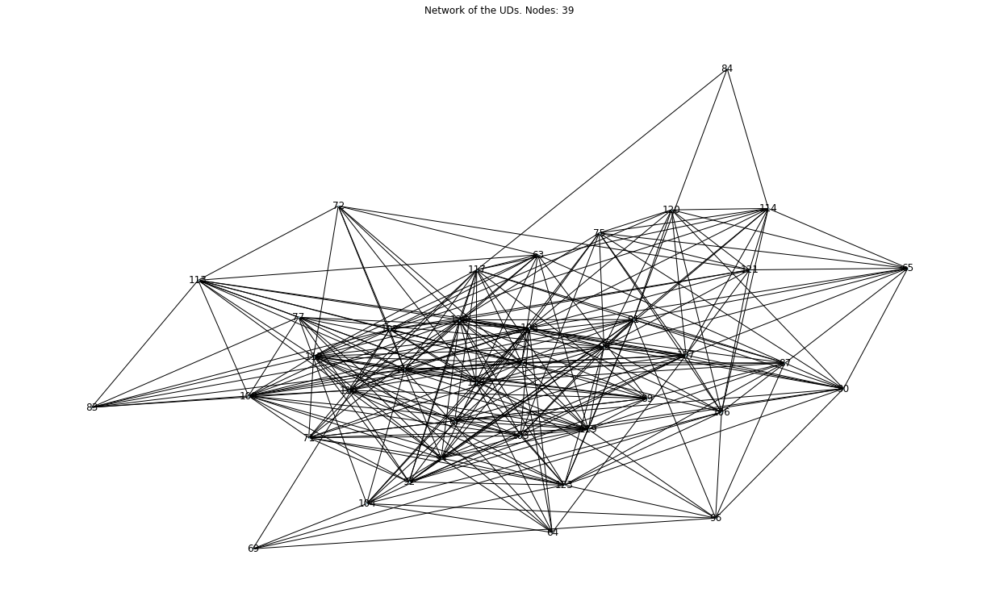

Betweenness Centrality:
{108: 0.06316437369068947, 122: 0.048851630430577796, 102: 0.047654892391734496, 91: 0.04584219057903268, 107: 0.03665595770858929, 99: 0.03246036403931141, 112: 0.03145694724642093, 115: 0.030202128886339406, 117: 0.03007259586206955, 123: 0.02811976233028865}

Closeness Centrality:
{122: 0.7450980392156863, 108: 0.7169811320754716, 112: 0.7037037037037037, 115: 0.6909090909090909, 119: 0.6909090909090909, 99: 0.6909090909090909, 116: 0.6785714285714286, 118: 0.6666666666666666, 107: 0.6666666666666666, 94: 0.6666666666666666}

Degree Centrality:
{122: 0.6578947368421052, 108: 0.6052631578947368, 112: 0.5789473684210527, 115: 0.5526315789473684, 119: 0.5526315789473684, 99: 0.5526315789473684, 116: 0.5263157894736842, 118: 0.5, 107: 0.5, 94: 0.5}

Eigenvector Centrality:
{122: 0.26724101769567626, 112: 0.2392377968875806, 119: 0.23020632747008854, 116: 0.22336353575887777, 94: 0.2170658958483026, 115: 0.214567102426605, 99: 0.21429086795136285, 108: 0.212057671

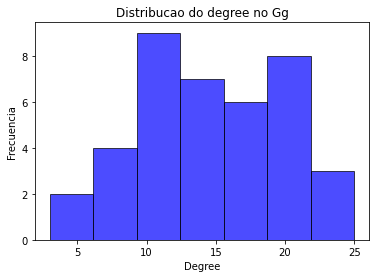

Densidade: 0.3832658569500675
Número de nós: 39
Número de aristas: 284
Diámetro: 3
Transitividade: 0.5872869645324735
Average shorthest path: 1.6369770580296896
Coeficiente de Clustering Promedio (cluster maior): 0.646610863527469
----------------------------


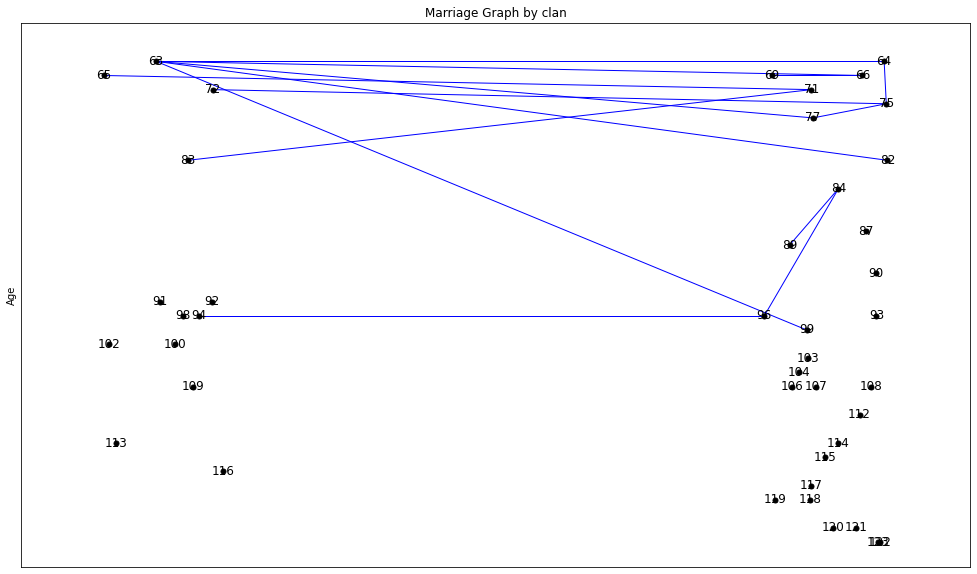

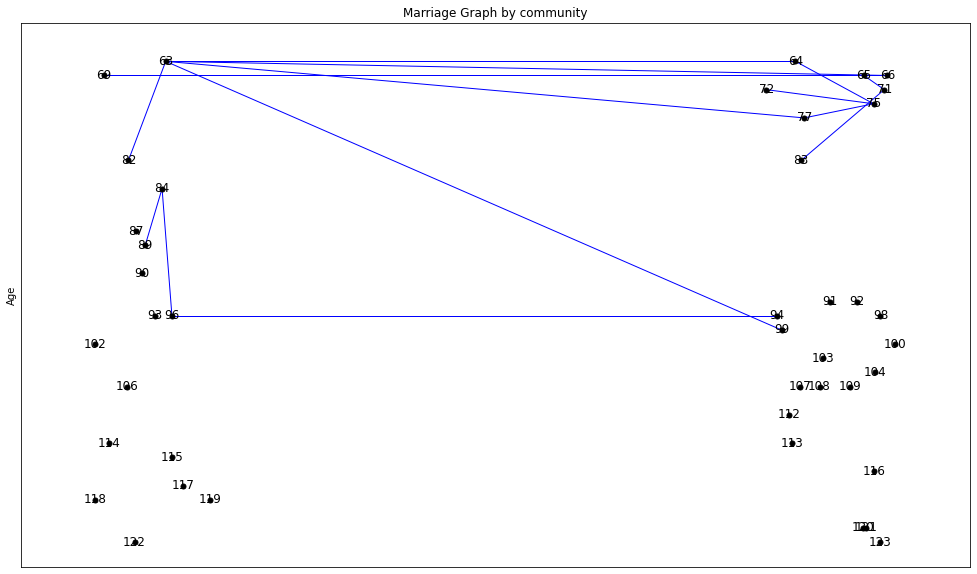

Total de enlaces: 14
Links inside the clan '2': 35.71%
Linkgs outside the clan '1' and '2': 57.14%
Linkgs outside the clan '2' and '1': 7.14%
Total de enlaces: 14
Links inside the community '1': 21.43%
Links inside the community '2': 35.71%
Linkgs outside the community '1' and '2': 28.57%
Linkgs outside the community '2' and '1': 14.29%


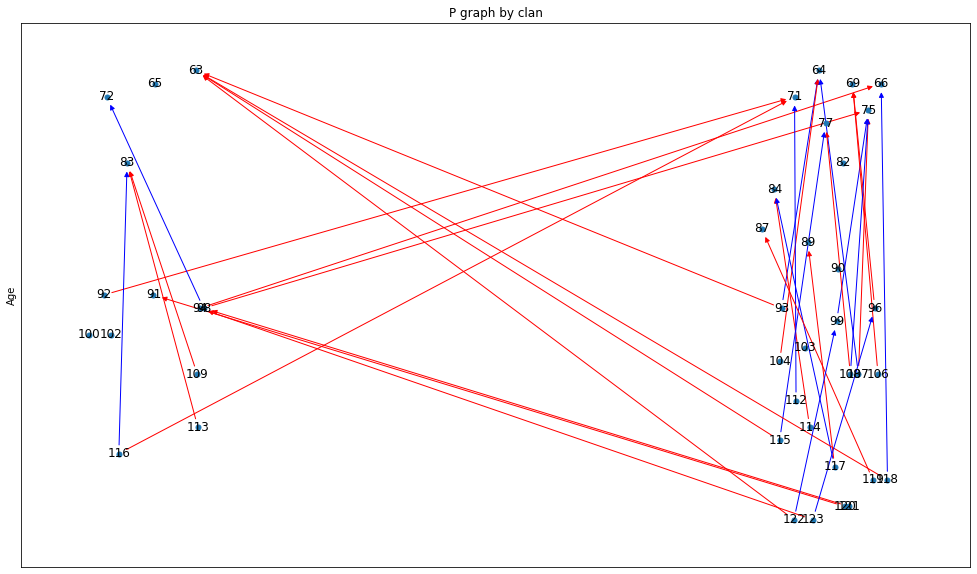

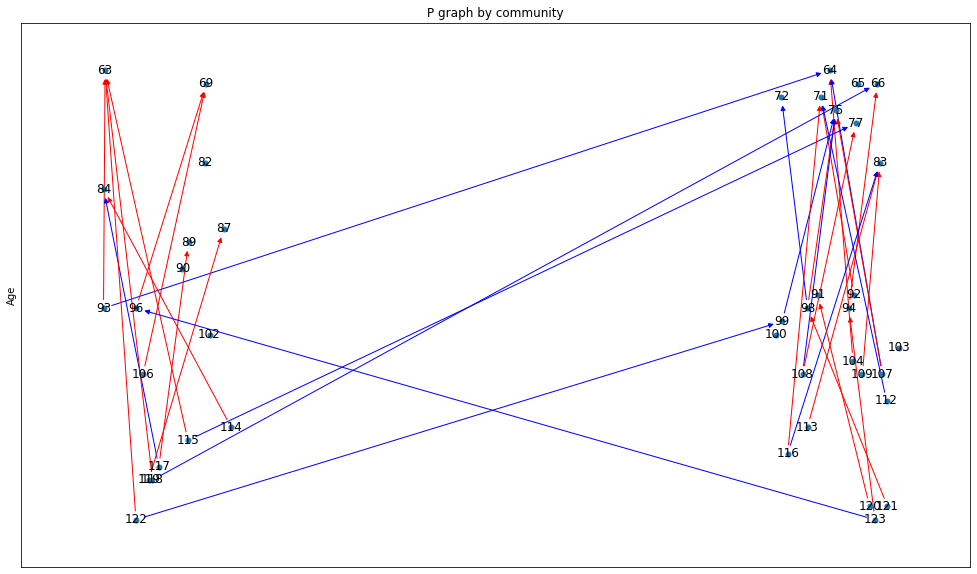

tamos en tiempo 50 con vivas 40
39


In [3]:
#DUAL ORGANIZATION
#Parameters dual_organization
iniciais = 30 # Initial UD
clans = (list(range(1, 2 + 1)) * (iniciais // 2)) # Just 2 clans
communities = (list(range(1, 2 + 1)) * (iniciais // 2)) # Just 2 communities
random.shuffle(clans)
random.shuffle(communities)
prob_morte = 0.06 # Beta from the gutertz equation
media = 4 # Average children per UD
random.seed(42) # Random seed
t = 51 #steps of the simulation
dataset = [] #For the data

#### Initialization dual_organization
## Communities
UD_dual_organization.uds = {}
instancias_ud = []
for id_ud in range(1, int(iniciais) + 1):
        instancias_ud.append(UD_dual_organization(id_ud*2, media, communities.pop(), clans.pop()))
## Varieties
limited_varieties = True
if limited_varieties == False:
    for id_ud, ud in UD_dual_organization.uds.items():
        for _ in range(5):
            ud.varieties.append(Variety())
else:
    initial_varieties = [Variety() for _ in range (10)]
    for ud in UD_dual_organization.uds.values():
        for _ in range(3):
            ud.varieties.append(random.choice(initial_varieties))
#### Simulation
vivas = [int(iniciais)]
for i in range (1, (t)):
    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization.uds.items() if ud.activa}
    if not uds_copy:
        print("acabo")
        break
    for id_ud, ud in uds_copy.items():
        ud.ter_filho()
        #(self, media, matrilinear, locality, inheritance
        ud.buscar_ud(media, 50, True, False)
        ud.incrementar_idade()
        ud.death_probability(prob_morte)
    if i % 50 == 0:
        create_vis_geral(uds_copy, True)
        Gcl = marriage_graph_attribute(uds_copy, "clan", False)
        Gco = marriage_graph_attribute(uds_copy, "community", False)
        # clan
        results_clan = count_links_between_and_within(Gcl, "clan")
        # community
        results_community = count_links_between_and_within(Gco, "community")
        p_graph_attribute(uds_copy, "clan", False)
        p_graph_attribute(uds_copy, "community", False)
        # Get the dyacronic data
        #dataset = general_charactersitics_data(i, uds_copy, dataset, False, True)
        print(f"tamos en tiempo {i} con vivas {viv}")

    # Collecting data for populational dynamics
    viv = len([ud for id, ud in uds_copy.items() if ud.activa])
    vivas.append(viv)
        
print(len([ud for id, ud in uds_copy.items() if ud.activa]))
#final = general_charactersitics_data(None, None, dataset, final = True, clan = True)
individuals, families = generate_puck(UD_dual_organization.uds, True)

In [11]:
individuals, families = generate_puck(UD_dual_organization.uds, True)

In [5]:
import pandas as pd

def generate_puck(uds, clan=False):
    if not clan:
        puck_dataset_individuals = []
        puck_dataset_families = []
        for ud in uds.values():
            id_female = ud.female[0]
            name_female = f" F {ud.female[0]}"
            gender_female = "F"
            puck_dataset_individuals.append([id_female, name_female, gender_female])
            id_male = ud.male[0]
            name_male = f" H {ud.male[0]}"
            gender_male = "H"
            puck_dataset_individuals.append([id_male, name_male, gender_male])

            id_family = ud.id
            Status = "M"
            FatherID = ud.male[0]
            MotherID = ud.female[0]
            Children = ';'.join(map(str, ud.parentes[2])) if ud.parentes[2] else ''
            puck_dataset_families.append([id_family, "M", FatherID, MotherID, Children])

        df_individuals = pd.DataFrame(puck_dataset_individuals, columns=["ID", "Name", "Gender"])
        df_families = pd.DataFrame(puck_dataset_families, columns=["ID", "Status", 'FatherId', "MotherId", "Children"])
    else:
        puck_dataset_individuals = []
        puck_dataset_families = []
        for ud in uds.values():
            id_female = ud.female[0]
            clan_female = ud.female[1]
            name_female = f" F {ud.female[0]}"
            gender_female = "F"
            puck_dataset_individuals.append([id_female, name_female, gender_female, clan_female])
            id_male = ud.male[0]
            clan_male = ud.male[1]
            name_male = f" H {ud.male[0]}"
            gender_male = "H"
            puck_dataset_individuals.append([id_male, name_male, gender_male, clan_male])

            id_family = ud.id
            Status = "M"
            FatherID = ud.male[0]
            MotherID = ud.female[0]
            Children = ';'.join(map(str, ud.parentes[2])) if ud.parentes[2] else ''
            puck_dataset_families.append([id_family, "M", FatherID, MotherID, Children])

        df_individuals = pd.DataFrame(puck_dataset_individuals, columns=["ID", "Name", "Gender", "Clan"])
        df_families = pd.DataFrame(puck_dataset_families, columns=["ID", "Status", 'FatherId', "MotherId", "Children"])

    # Save dataframes to text files in the required format
    df_individuals.to_csv('individuals.txt', sep='\t', index=False)
    df_families.to_csv('families.txt', sep='\t', index=False)

    return df_individuals, df_families

In [7]:
individuals

,ID,Name,Gender,Clan
0,2.5,F 2.5,F,0
1,2.1,H 2.1,H,0
2,4.5,F 4.5,F,0
3,4.1,H 4.1,H,0
4,6.5,F 6.5,F,0
...,...,...,...,...
183,122.1,H 122.1,H,2
184,123.5,F 123.5,F,1
185,123.1,H 123.1,H,2
186,124.5,F 124.5,F,2


In [8]:
# Folder
folder_name = 'resultados_puck'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
    
# Define the path to the output Excel file
excel_file_path = os.path.join(folder_name, 'Dual_organization_puck_dataset.xls')

# Write the DataFrames to different sheets of the same Excel file
with pd.ExcelWriter(excel_file_path, engine='xlwt') as writer:
    individuals.to_excel(writer, sheet_name='Individuals', index=False)
    families.to_excel(writer, sheet_name='Families', index=False)

# Print the location of the saved Excel file
print(f"El archivo Excel se ha guardado en {excel_file_path}")


# # Dual_organization
csv_path = os.path.join(folder_name, 'Dual_organization_puck_dataset_individuals.txt')
individuals.to_csv(csv_path, index=False)
csv_path = os.path.join(folder_name, 'Dual_organization_puck_dataset_families.txt')
families.to_csv(csv_path, index=False)

C:\Users\jsolm\AppData\Local\Temp/ipykernel_11324/732981525.py:10: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead. You can set the option io.excel.xls.writer to 'xlwt' to silence this warning. While this option is deprecated and will also raise a warning, it can be globally set and the warning suppressed.
  with pd.ExcelWriter(excel_file_path, engine='xlwt') as writer:


El archivo Excel se ha guardado en resultados_puck\Dual_organization_puck_dataset.xls


In [13]:
# Folder
folder_name = 'resultados_puck'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

# Define the path to the output Excel file
excel_file_path = os.path.join(folder_name, 'Dual_organization_puck_dataset.xls')

# Write the DataFrames to different sheets of the same Excel file
with pd.ExcelWriter(excel_file_path, engine='xlwt') as writer:
    individuals.to_excel(writer, sheet_name='Individuals', index=False)
    families.to_excel(writer, sheet_name='Families', index=False)

# Save dataframes to text files in the required format
individuals_txt_path = os.path.join(folder_name, 'Dual_organization_puck_dataset_individuals.txt')
individuals.to_csv(individuals_txt_path, sep='\t', index=False)

families_txt_path = os.path.join(folder_name, 'Dual_organization_puck_dataset_families.txt')
families.to_csv(families_txt_path, sep='\t', index=False)

# Print the location of the saved files
print(f"El archivo Excel se ha guardado en {excel_file_path}")
print(f"El archivo de texto de individuos se ha guardado en {individuals_txt_path}")
print(f"El archivo de texto de familias se ha guardado en {families_txt_path}")

    #return df_individuals, df_families

El archivo Excel se ha guardado en resultados_puck\Dual_organization_puck_dataset.xls
El archivo de texto de individuos se ha guardado en resultados_puck\Dual_organization_puck_dataset_individuals.txt
El archivo de texto de familias se ha guardado en resultados_puck\Dual_organization_puck_dataset_families.txt


C:\Users\jsolm\AppData\Local\Temp/ipykernel_11324/2733618716.py:10: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead. You can set the option io.excel.xls.writer to 'xlwt' to silence this warning. While this option is deprecated and will also raise a warning, it can be globally set and the warning suppressed.
  with pd.ExcelWriter(excel_file_path, engine='xlwt') as writer:


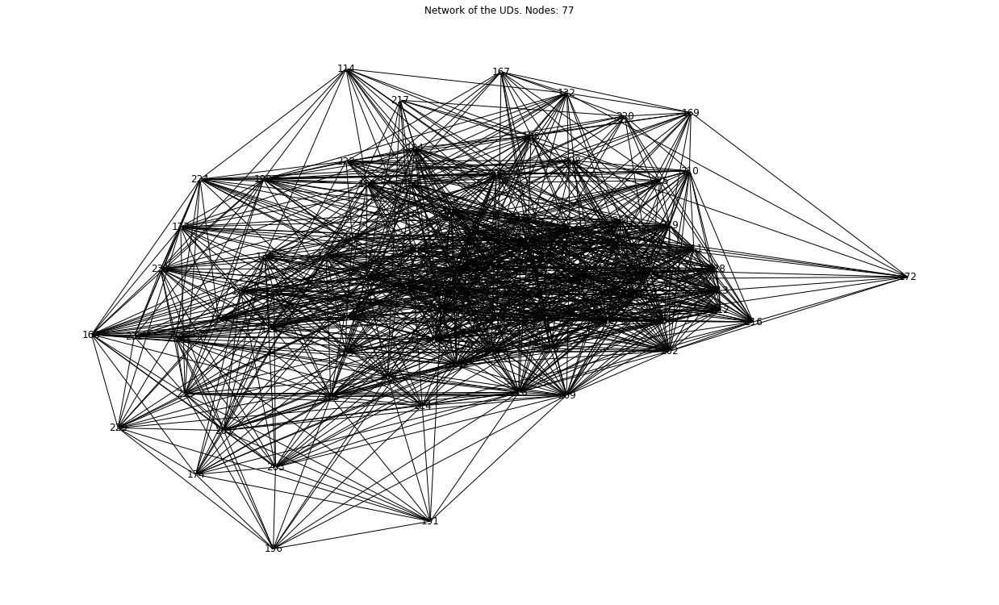

Betweenness Centrality:
{176: 0.029736903536986936, 218: 0.022774249229865557, 181: 0.018746471642783688, 204: 0.01761903185936737, 150: 0.016678875760719872, 152: 0.01613275794243775, 187: 0.01569782688370526, 141: 0.01545741714625502, 139: 0.015012748813949829, 209: 0.01400469745261457}

Closeness Centrality:
{176: 0.7378640776699029, 150: 0.7169811320754716, 187: 0.7102803738317757, 141: 0.7102803738317757, 181: 0.7102803738317757, 163: 0.7037037037037037, 130: 0.7037037037037037, 171: 0.6972477064220184, 162: 0.6972477064220184, 218: 0.6909090909090909}

Degree Centrality:
{176: 0.6447368421052632, 150: 0.6052631578947368, 187: 0.5921052631578947, 141: 0.5921052631578947, 181: 0.5921052631578947, 163: 0.5789473684210527, 130: 0.5789473684210527, 171: 0.5657894736842105, 162: 0.5657894736842105, 218: 0.5526315789473684}

Eigenvector Centrality:
{176: 0.18013603144168205, 150: 0.17700646181243562, 141: 0.17404032659061233, 130: 0.17343557350528715, 163: 0.17280758815827948, 181: 0.17

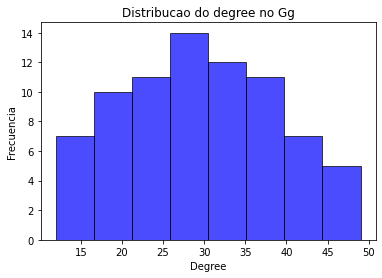

Densidade: 0.3889268626110731
Número de nós: 77
Número de aristas: 1138
Diámetro: 3
Transitividade: 0.5958153159436462
Average shorthest path: 1.6185919343814081
Coeficiente de Clustering Promedio (cluster maior): 0.5953798249400106
----------------------------


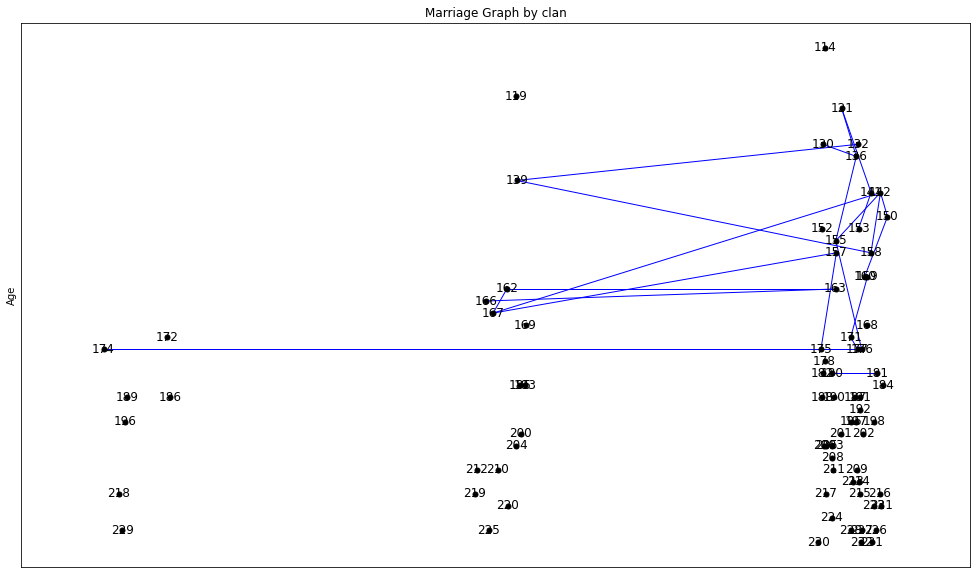

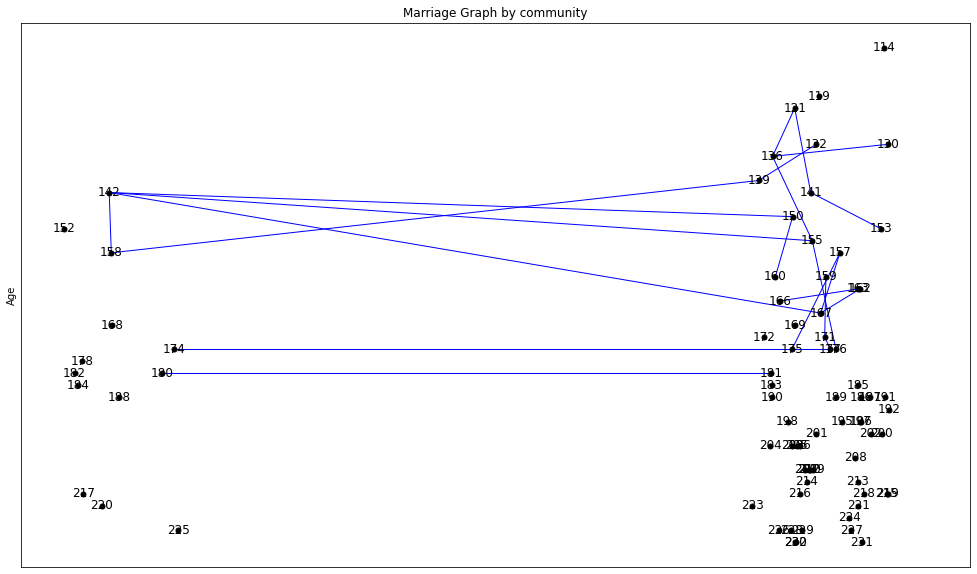

Total de enlaces: 22
Links inside the clan '3': 63.64%
Links inside the clan '2': 4.55%
Linkgs outside the clan '3' and '2': 18.18%
Linkgs outside the clan '2' and '3': 9.09%
Linkgs outside the clan '1' and '3': 4.55%
Total de enlaces: 22
Links inside the community '2': 68.18%
Links inside the community '1': 4.55%
Linkgs outside the community '2' and '1': 4.55%
Linkgs outside the community '1' and '2': 22.73%


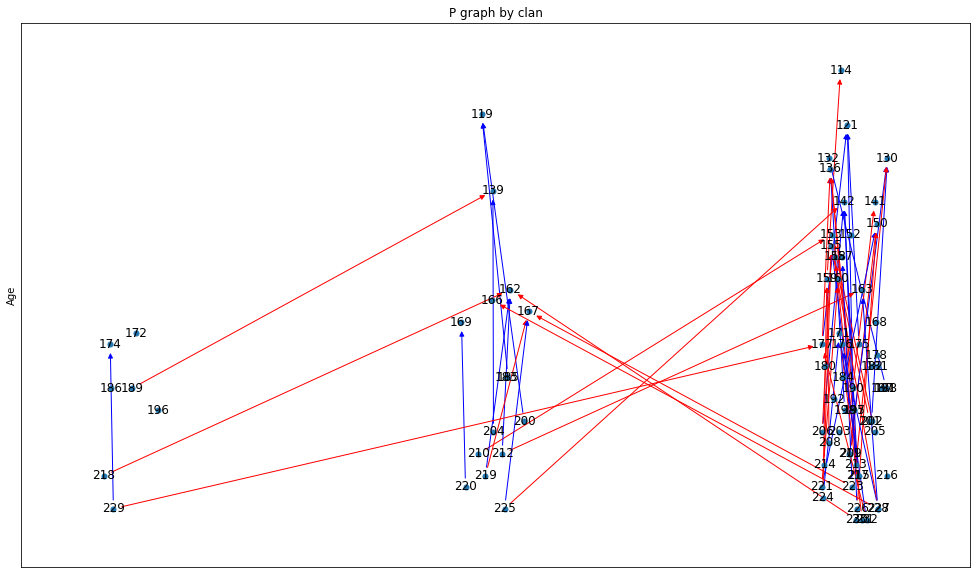

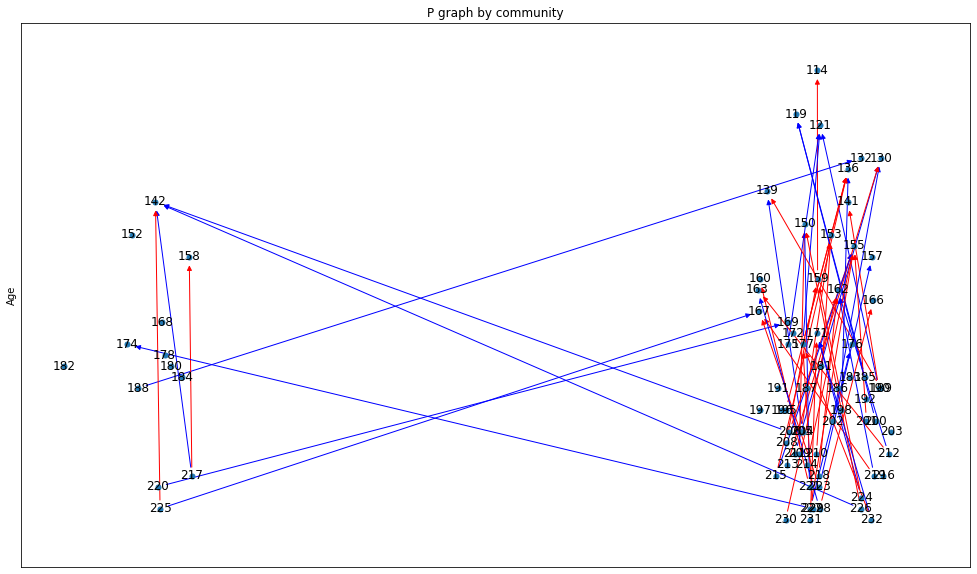

tamos en tiempo 100 con vivas 75


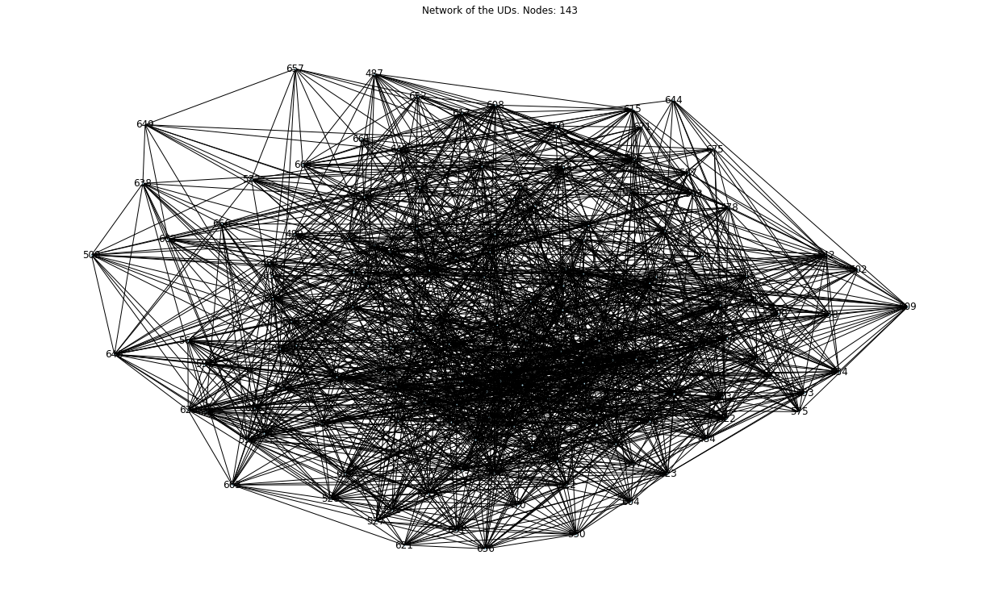

Betweenness Centrality:
{610: 0.02313612531541703, 635: 0.01855828844737854, 581: 0.017195867652628937, 567: 0.01714153239215654, 571: 0.016922261419306965, 566: 0.014568783239359888, 556: 0.014174302068999063, 624: 0.014174302068999063, 561: 0.014044564116053152, 580: 0.013307155914744878}

Closeness Centrality:
{556: 0.5795918367346938, 624: 0.5795918367346938, 571: 0.5772357723577236, 523: 0.5725806451612904, 581: 0.5725806451612904, 632: 0.570281124497992, 610: 0.568, 561: 0.568, 635: 0.5634920634920635, 567: 0.5612648221343873}

Degree Centrality:
{556: 0.3028169014084507, 624: 0.3028169014084507, 571: 0.2746478873239437, 523: 0.2605633802816901, 561: 0.2605633802816901, 581: 0.2605633802816901, 610: 0.2535211267605634, 594: 0.2535211267605634, 672: 0.2535211267605634, 632: 0.2535211267605634}

Eigenvector Centrality:
{556: 0.16665480046874837, 624: 0.16665480046874837, 571: 0.14408449005432966, 632: 0.1407426495194591, 523: 0.139968735877704, 561: 0.13814700189076382, 672: 0.1340

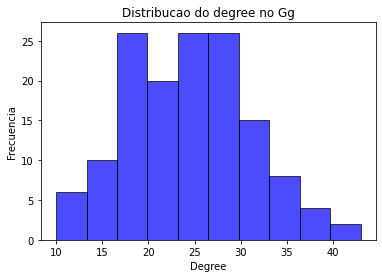

Densidade: 0.1713779178567911
Número de nós: 143
Número de aristas: 1740
Diámetro: 3
Transitividade: 0.438507306175485
Average shorthest path: 1.9126366591155324
Coeficiente de Clustering Promedio (cluster maior): 0.45388875515738153
----------------------------


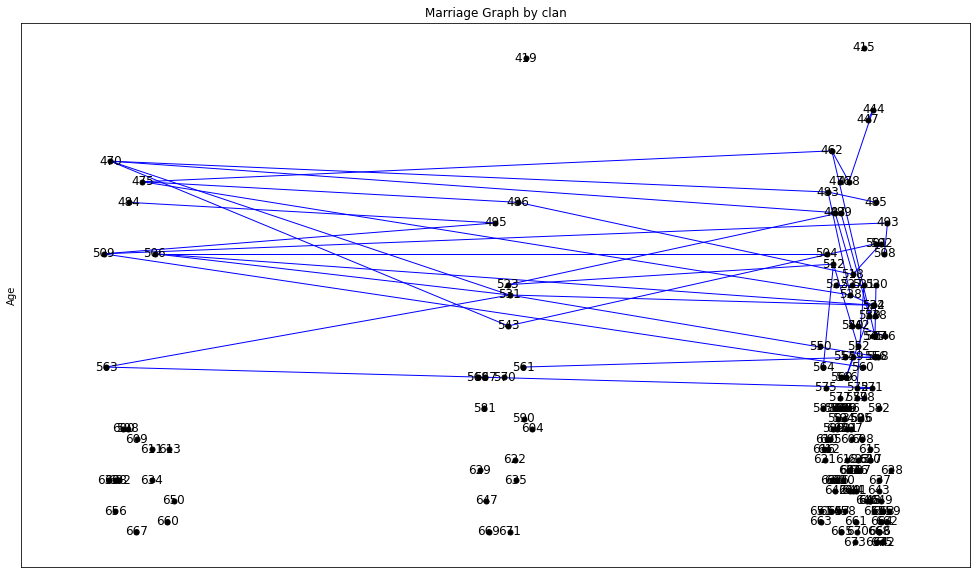

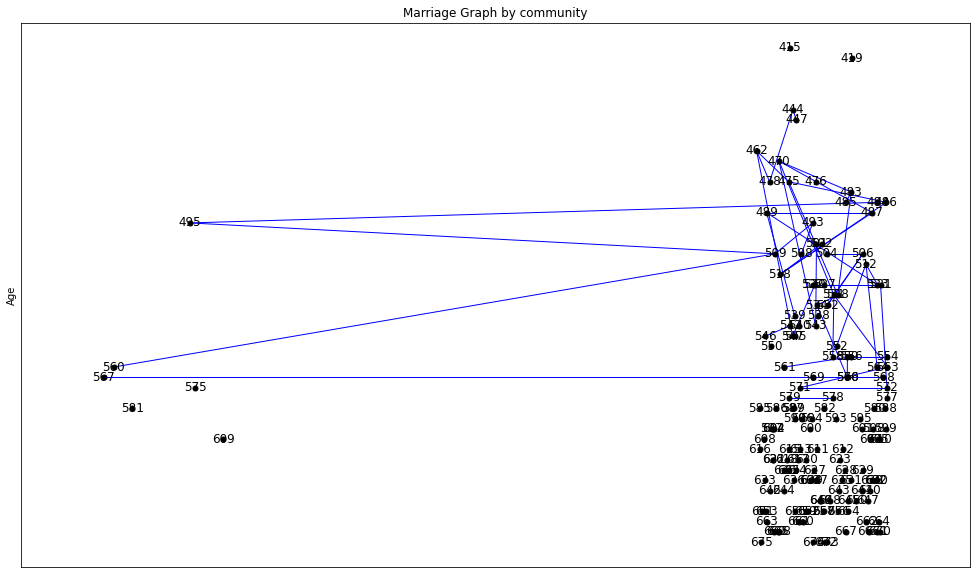

Total de enlaces: 47
Links inside the clan '3': 48.94%
Links inside the clan '2': 2.13%
Linkgs outside the clan '3' and '1': 6.38%
Linkgs outside the clan '1' and '3': 12.77%
Linkgs outside the clan '1' and '2': 10.64%
Linkgs outside the clan '2' and '3': 6.38%
Linkgs outside the clan '3' and '2': 8.51%
Linkgs outside the clan '2' and '1': 4.26%
Total de enlaces: 47
Links inside the community '2': 91.49%
Linkgs outside the community '2' and '1': 4.26%
Linkgs outside the community '1' and '2': 4.26%


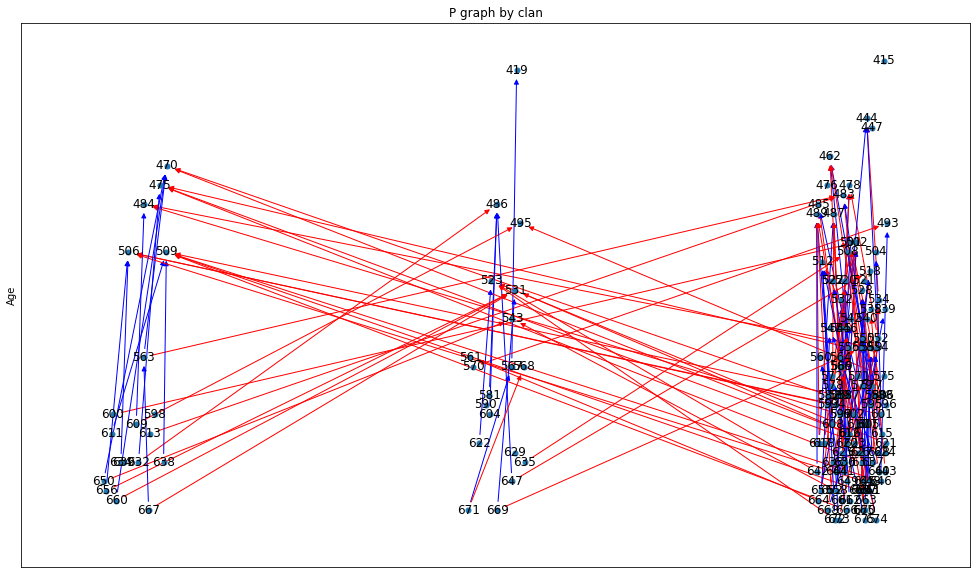

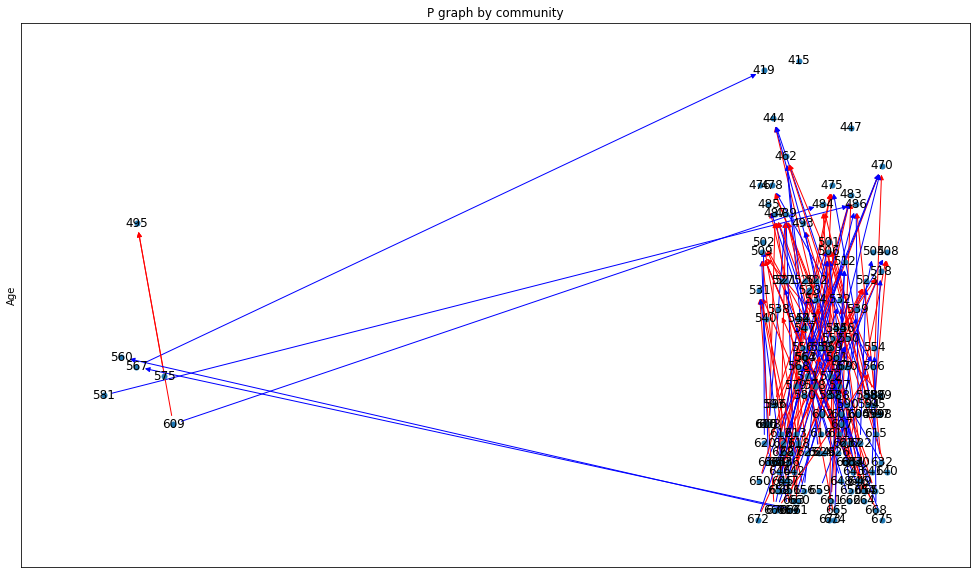

tamos en tiempo 200 con vivas 147


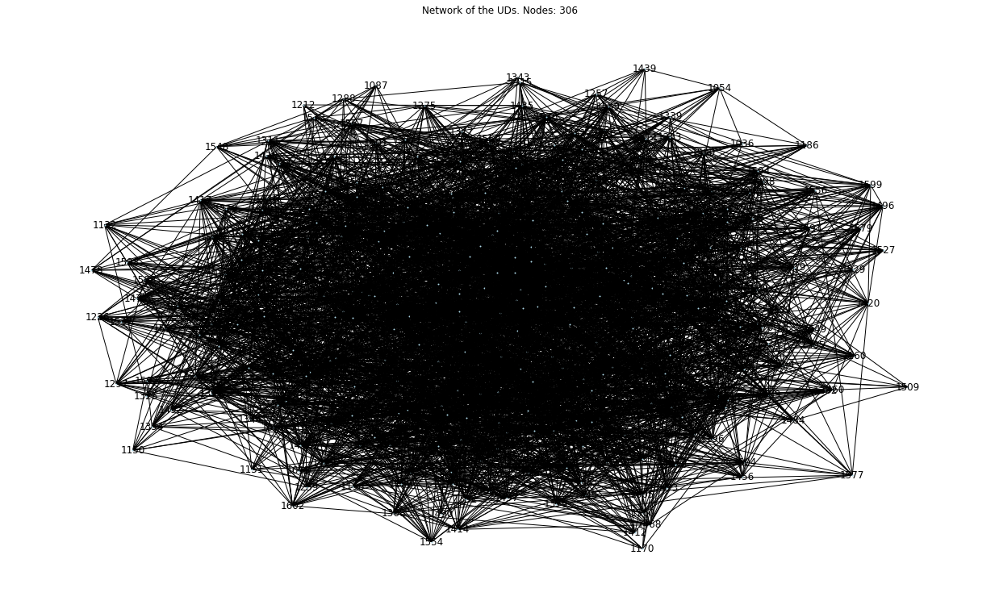

Betweenness Centrality:
{1380: 0.014417424738971518, 1429: 0.011501095541990119, 1336: 0.011433202730858164, 1329: 0.01033354880369128, 1434: 0.009885998422497586, 1333: 0.009833538539840422, 1251: 0.009358287980416252, 1519: 0.009306089175607414, 1375: 0.00892365916533088, 1561: 0.008873058418349313}

Closeness Centrality:
{1380: 0.5313588850174216, 1488: 0.5249569707401033, 1434: 0.5231560891938251, 1333: 0.5187074829931972, 1418: 0.5187074829931972, 1519: 0.5187074829931972, 1361: 0.5152027027027027, 1336: 0.5143338954468802, 1306: 0.5143338954468802, 1571: 0.5134680134680135}

Degree Centrality:
{1380: 0.1737704918032787, 1488: 0.16065573770491803, 1418: 0.1540983606557377, 1329: 0.15081967213114755, 1333: 0.15081967213114755, 1434: 0.15081967213114755, 1519: 0.15081967213114755, 1361: 0.15081967213114755, 1561: 0.14754098360655737, 1336: 0.14754098360655737}

Eigenvector Centrality:
{1418: 0.1202661803194113, 1380: 0.11445351135855329, 1519: 0.10809160466211017, 1434: 0.1066941358

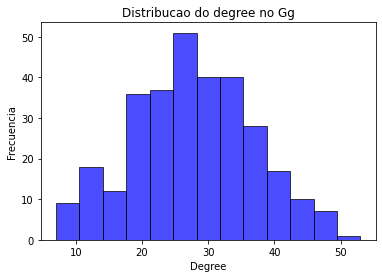

Densidade: 0.09096753455480552
Número de nós: 306
Número de aristas: 4245
Diámetro: 4
Transitividade: 0.4065847548610283
Average shorthest path: 2.164470159648559
Coeficiente de Clustering Promedio (cluster maior): 0.42322980543732486
----------------------------


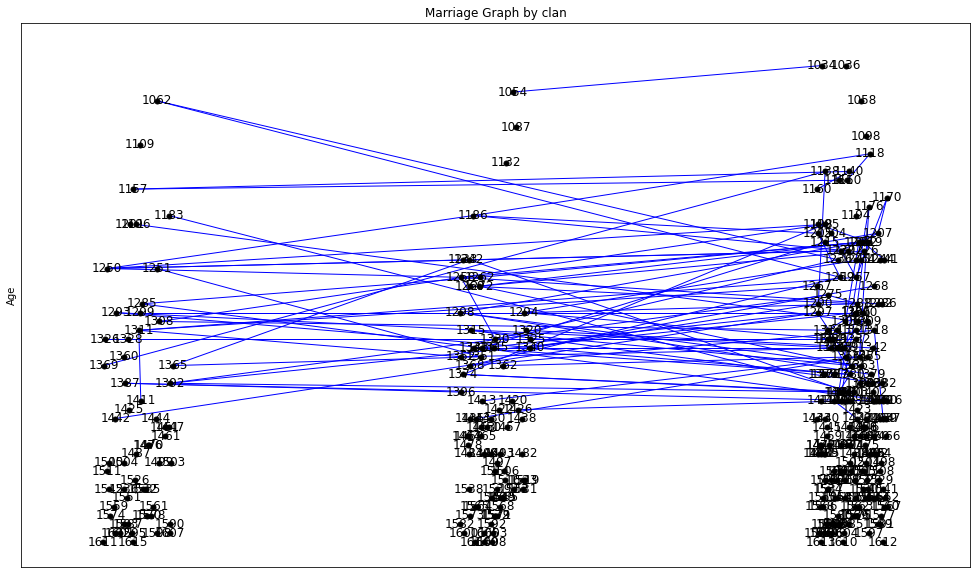

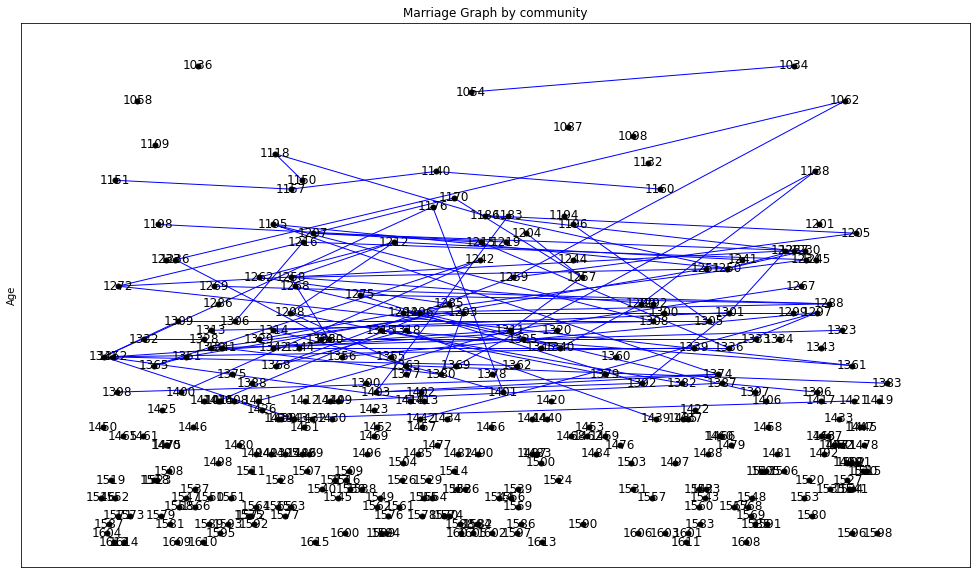

Total de enlaces: 101
Links inside the clan '3': 27.72%
Links inside the clan '2': 0.99%
Links inside the clan '1': 0.99%
Linkgs outside the clan '3' and '2': 21.78%
Linkgs outside the clan '1' and '3': 11.88%
Linkgs outside the clan '3' and '1': 12.87%
Linkgs outside the clan '2' and '3': 15.84%
Linkgs outside the clan '2' and '1': 3.96%
Linkgs outside the clan '1' and '2': 3.96%
Total de enlaces: 101
Links inside the community '2': 100.00%


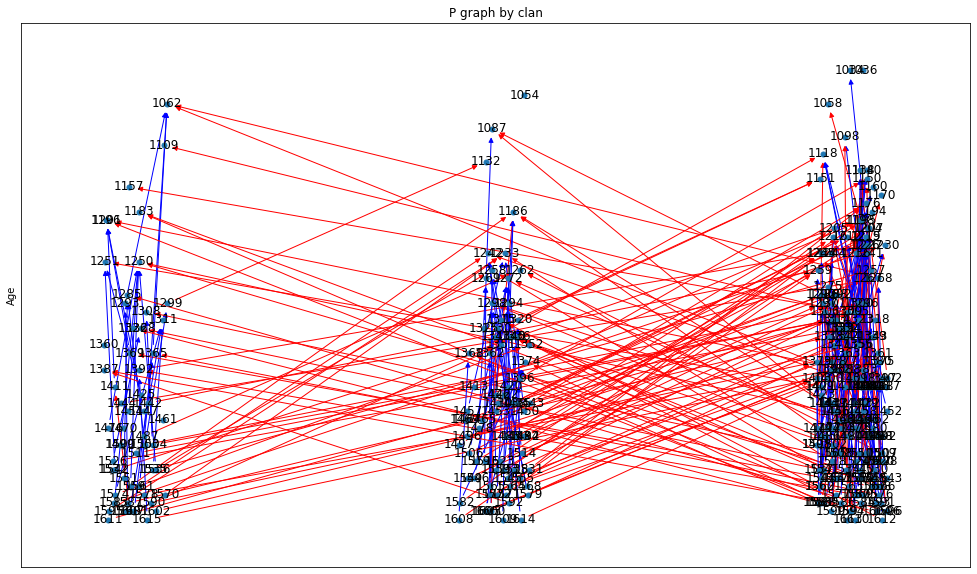

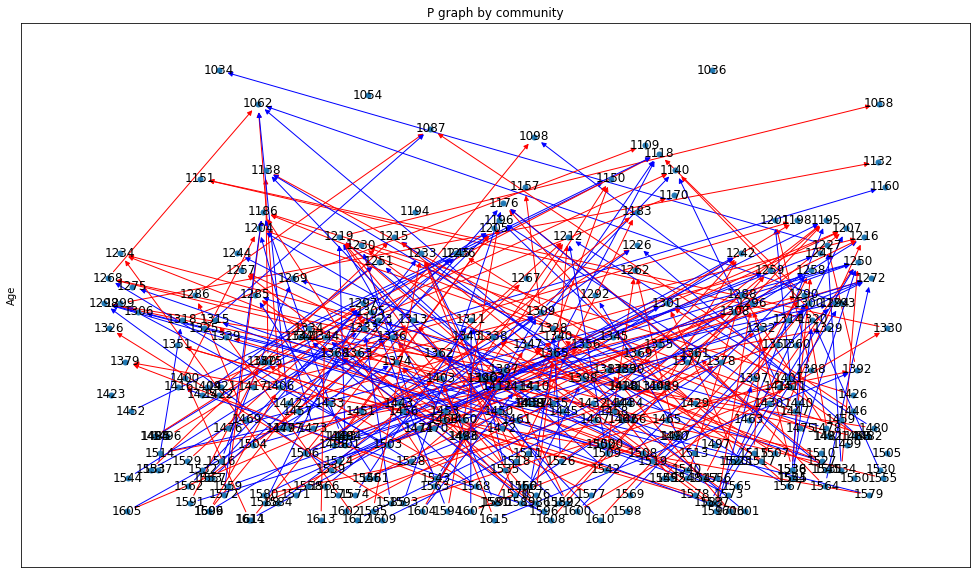

tamos en tiempo 300 con vivas 309
306


In [6]:
#UD_restricted
#Parameters restricted_exchange
iniciais = 30 # Initial UD
clans = (list(range(1, 3 + 1)) * (iniciais // 3)) # Just 3 clans
communities = (list(range(1, 2 + 1)) * (iniciais // 2)) # Just 2 communities
random.shuffle(clans)
random.shuffle(communities)
prob_morte = 0.06 # Beta from the gutertz equation
media = 4 # Average children per UD
#random.seed(42) # Random seed
t = 301 #steps of the simulation
dataset = [] #For the data

#### Initialization restricted_exchange
## Communities
UD_restricted.uds = {}
instancias_ud = []
for id_ud in range(1, int(iniciais) + 1):
        instancias_ud.append(UD_restricted(id_ud, media, communities.pop(), clans.pop()))
## Varieties
limited_varieties = True
if limited_varieties == False:
    for id_ud, ud in UD_restricted.uds.items():
        for _ in range(5):
            ud.varieties.append(Variety())
else:
    initial_varieties = [Variety() for _ in range (10)]
    for ud in UD_restricted.uds.values():
        for _ in range(3):
            ud.varieties.append(random.choice(initial_varieties))
#### Simulation
vivas = [int(iniciais)]
for i in range (1, (t)):
    uds_copy = {id_ud: ud for id_ud, ud in UD_restricted.uds.items() if ud.activa}
    if not uds_copy:
        print("acabo")
        break
    for id_ud, ud in uds_copy.items():
        ud.ter_filho()
        ud.buscar_ud(media, 50, True, False)
        ud.incrementar_idade()
        ud.death_probability(prob_morte)
    if i % 100 == 0:
        create_vis_geral(uds_copy, True)
        Gcl = marriage_graph_attribute(uds_copy, "clan", False)
        Gco = marriage_graph_attribute(uds_copy, "community", False)
        # clan
        results_clan = count_links_between_and_within(Gcl, "clan")
        # community
        results_community = count_links_between_and_within(Gco, "community")
        p_graph_attribute(uds_copy, "clan", False)
        p_graph_attribute(uds_copy, "community", False)
        # Get the dyacronic data
        dataset = general_charactersitics_data(i, uds_copy, dataset, False, True)
        print(f"tamos en tiempo {i} con vivas {viv}")

    # Collecting data for populational dynamics
    viv = len([ud for id, ud in uds_copy.items() if ud.activa])
    vivas.append(viv)
        
print(len([ud for id, ud in uds_copy.items() if ud.activa]))
final = general_charactersitics_data(None, None, dataset, final = True, clan = True)
individuals, families = generate_puck(UD_restricted.uds, True)

In [7]:
# Folder
folder_name = 'resultados_puck'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
#Restricted
csv_path = os.path.join(folder_name, 'Restricted_puck_dataset_individuals.csv')
individuals.to_csv(csv_path, index=False)
csv_path = os.path.join(folder_name, 'Restricted_puck_dataset_families.csv')
families.to_csv(csv_path, index=False)

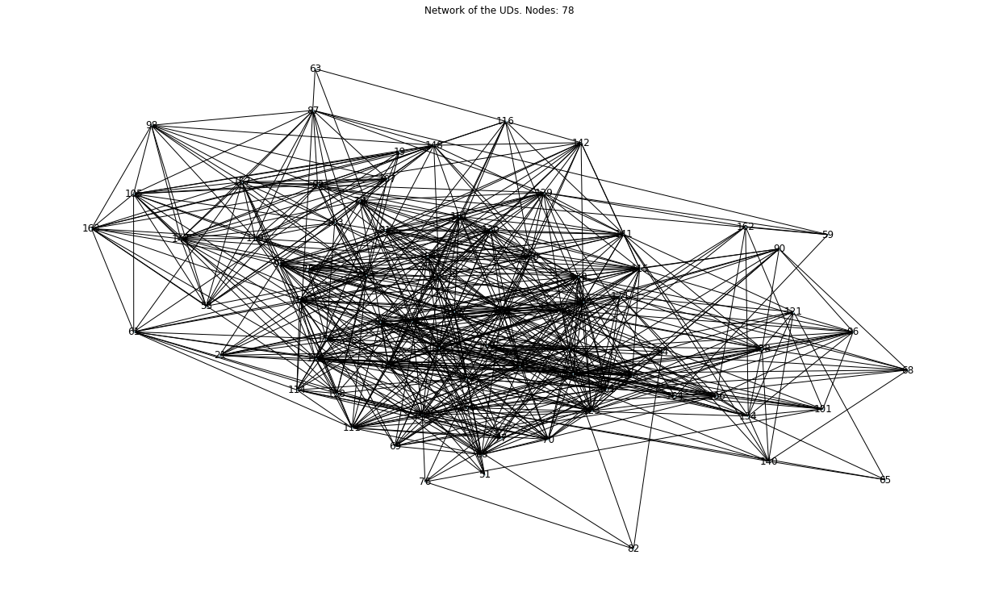

Betweenness Centrality:
{143: 0.0526825522013488, 159: 0.04773058494930918, 153: 0.03720348897590875, 120: 0.035880588402061125, 136: 0.03576800764375691, 129: 0.033858802863047086, 135: 0.030742531907137757, 152: 0.02658689521815111, 141: 0.02592559749421493, 131: 0.024340786165917245}

Closeness Centrality:
{144: 0.6363636363636364, 132: 0.6311475409836066, 135: 0.616, 120: 0.6111111111111112, 159: 0.6111111111111112, 151: 0.6062992125984252, 156: 0.6062992125984252, 131: 0.6015625, 143: 0.6015625, 145: 0.5968992248062015}

Degree Centrality:
{144: 0.48051948051948057, 132: 0.4285714285714286, 159: 0.4155844155844156, 156: 0.4025974025974026, 135: 0.4025974025974026, 131: 0.38961038961038963, 146: 0.38961038961038963, 120: 0.37662337662337664, 139: 0.37662337662337664, 123: 0.37662337662337664}

Eigenvector Centrality:
{144: 0.23427178014535502, 132: 0.2120196164398583, 156: 0.1983588739517342, 135: 0.1902754110367279, 145: 0.18887792168146925, 146: 0.18873905351395148, 131: 0.186696

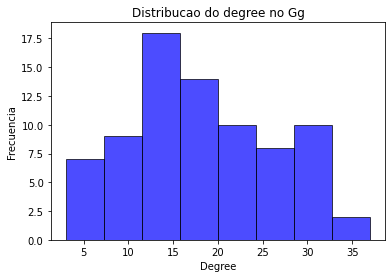

Densidade: 0.23809523809523808
Número de nós: 78
Número de aristas: 715
Diámetro: 4
Transitividade: 0.569841376079245
Average shorthest path: 1.9244089244089244
Coeficiente de Clustering Promedio (cluster maior): 0.6278057453790731
----------------------------


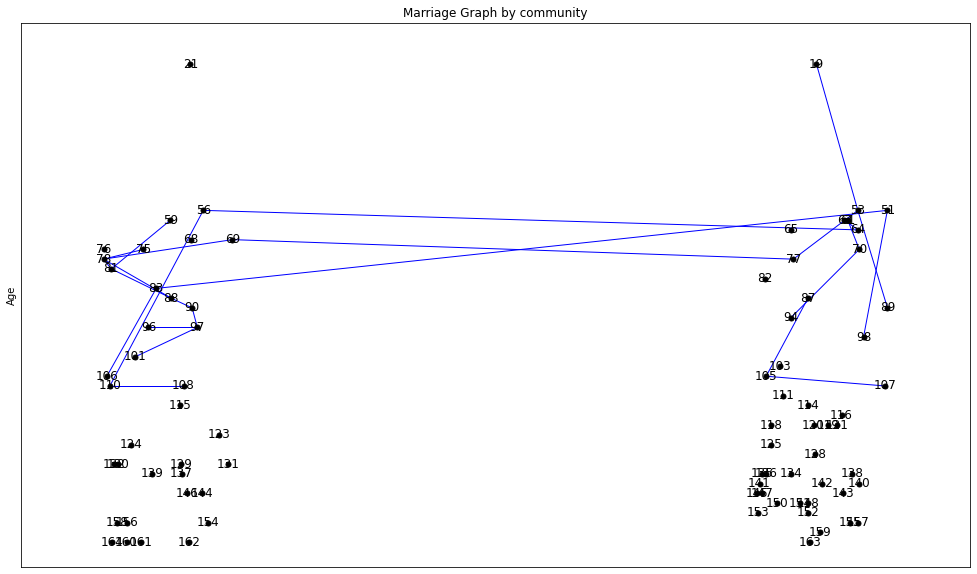

Total de enlaces: 25
Links inside the community '2': 36.00%
Links inside the community '1': 52.00%
Linkgs outside the community '2' and '1': 4.00%
Linkgs outside the community '1' and '2': 8.00%


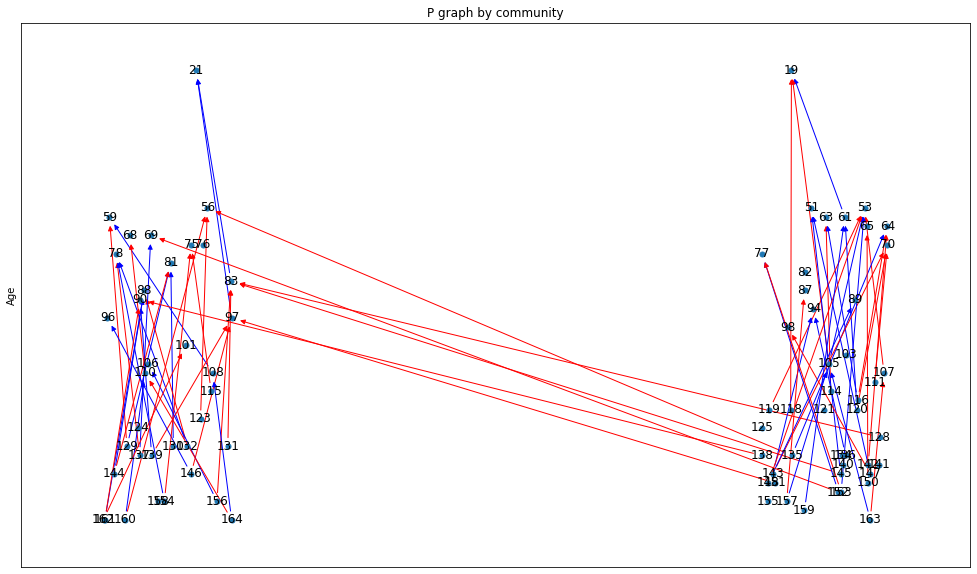

tamos en tiempo 50 con vivas 76


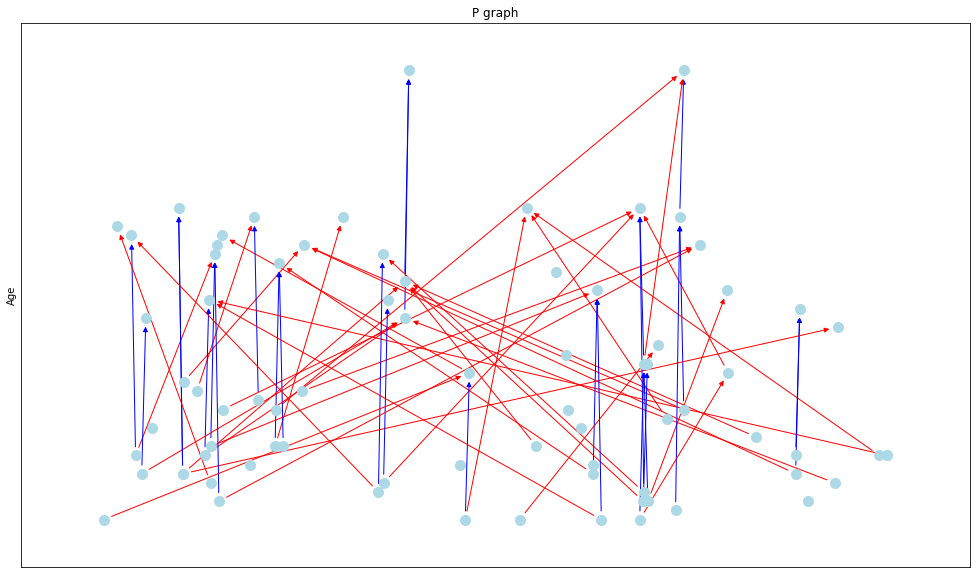

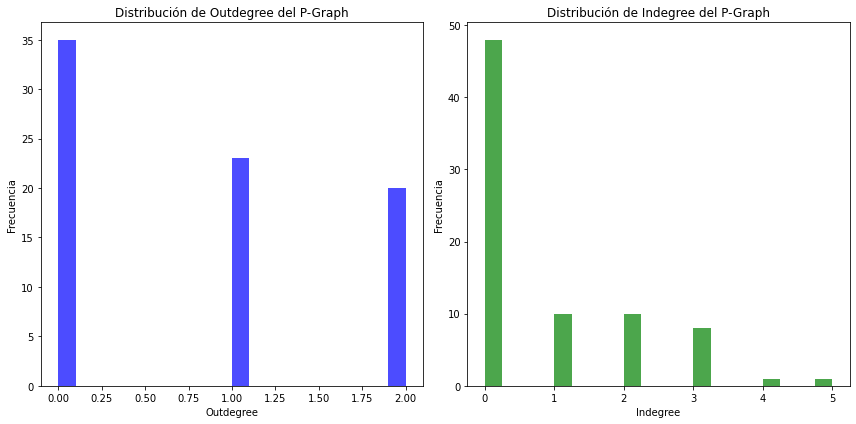

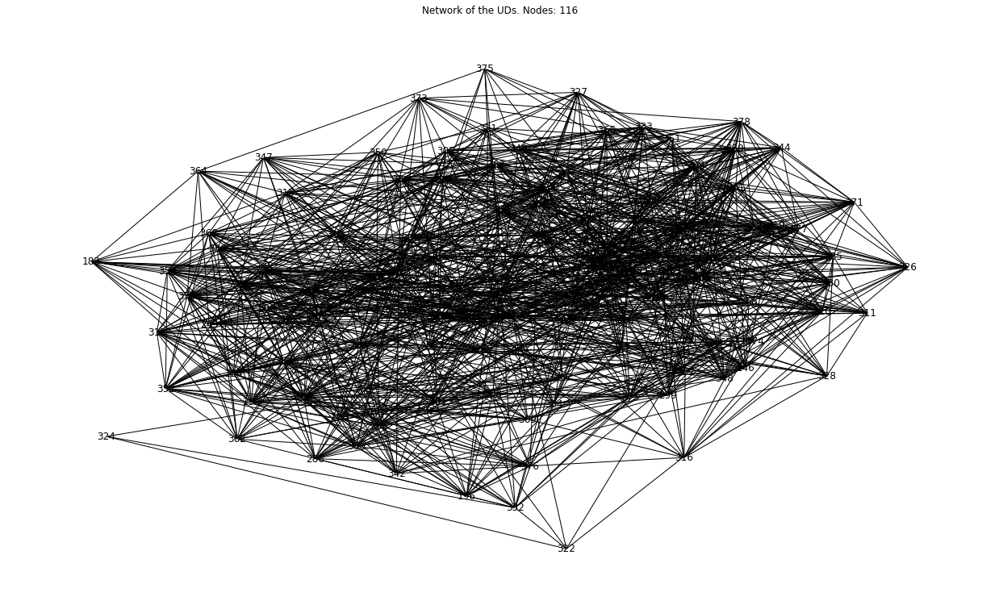

Betweenness Centrality:
{280: 0.025364052210442186, 283: 0.022910573730118112, 227: 0.02036859525213151, 367: 0.0203121620157326, 261: 0.017782533396488602, 298: 0.016965803877989166, 267: 0.01587324534822476, 244: 0.015187139868159557, 270: 0.014896238616877814, 225: 0.014553955705076659}

Closeness Centrality:
{261: 0.6084656084656085, 280: 0.6052631578947368, 283: 0.6052631578947368, 325: 0.6020942408376964, 244: 0.5989583333333334, 314: 0.5989583333333334, 262: 0.5958549222797928, 341: 0.5958549222797928, 227: 0.5958549222797928, 276: 0.5897435897435898}

Degree Centrality:
{261: 0.3652173913043478, 280: 0.3565217391304348, 244: 0.34782608695652173, 283: 0.34782608695652173, 314: 0.34782608695652173, 325: 0.34782608695652173, 341: 0.3391304347826087, 262: 0.33043478260869563, 227: 0.32173913043478264, 298: 0.3130434782608696}

Eigenvector Centrality:
{314: 0.16972169947497126, 341: 0.16760907016317955, 325: 0.16733895778850066, 261: 0.1614755918246394, 244: 0.15961178637483392, 262

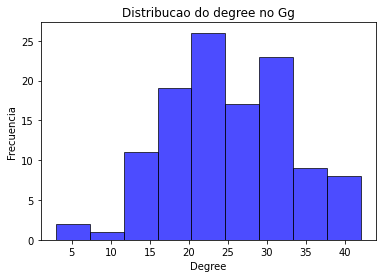

Densidade: 0.21754122938530734
Número de nós: 116
Número de aristas: 1451
Diámetro: 4
Transitividade: 0.46827857533675515
Average shorthest path: 1.8562218890554723
Coeficiente de Clustering Promedio (cluster maior): 0.48588512568524217
----------------------------


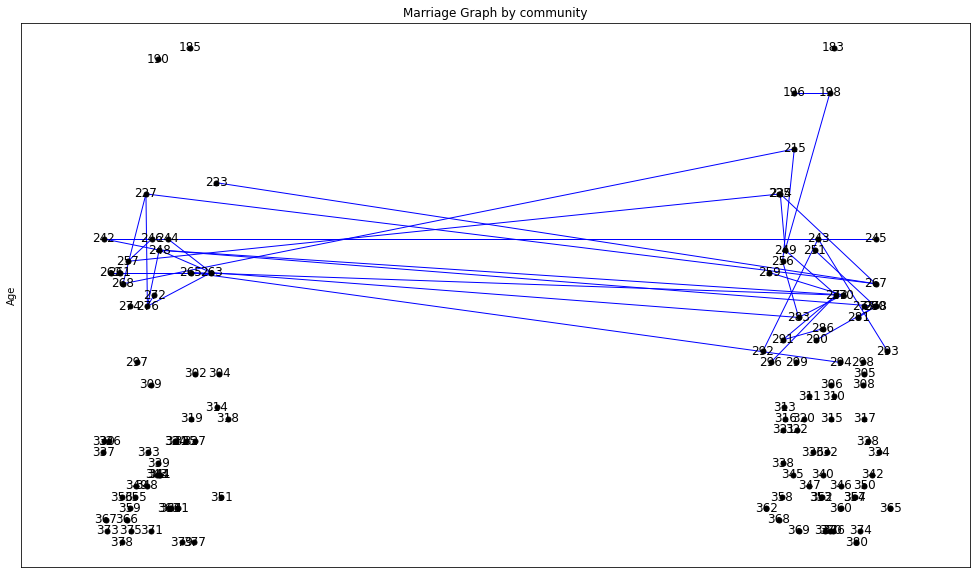

Total de enlaces: 39
Links inside the community '2': 43.59%
Links inside the community '1': 30.77%
Linkgs outside the community '2' and '1': 5.13%
Linkgs outside the community '1' and '2': 20.51%


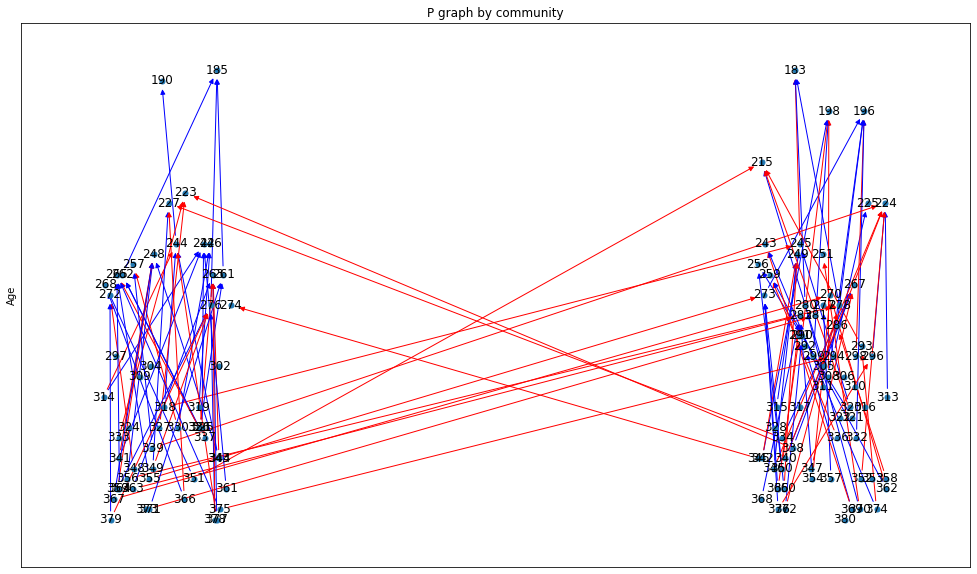

tamos en tiempo 100 con vivas 116


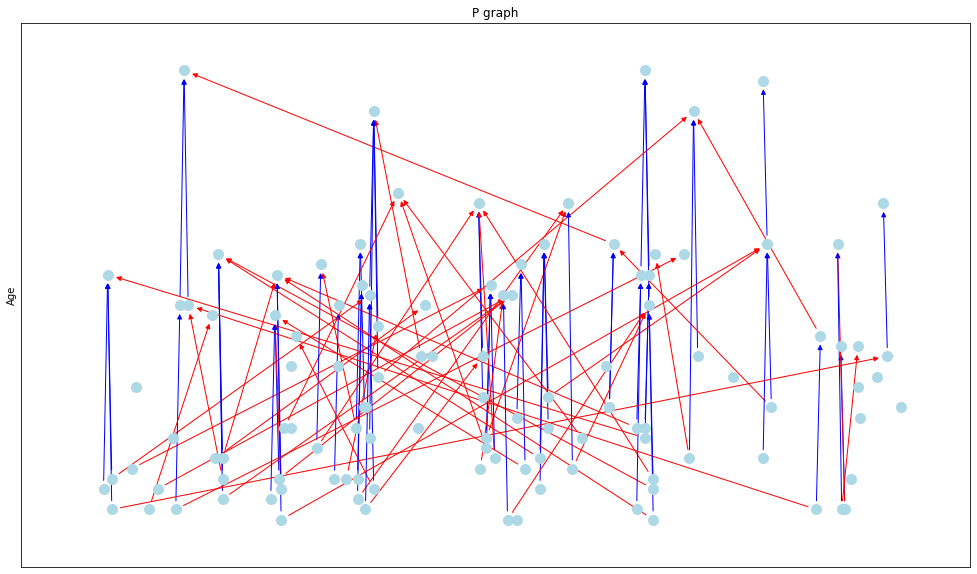

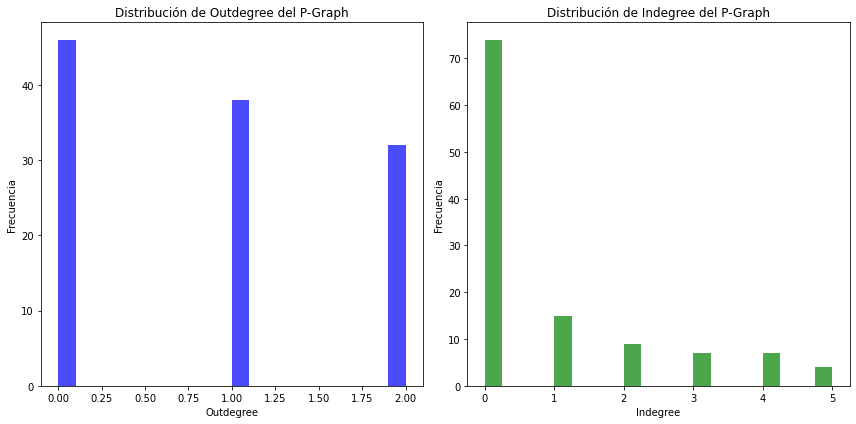

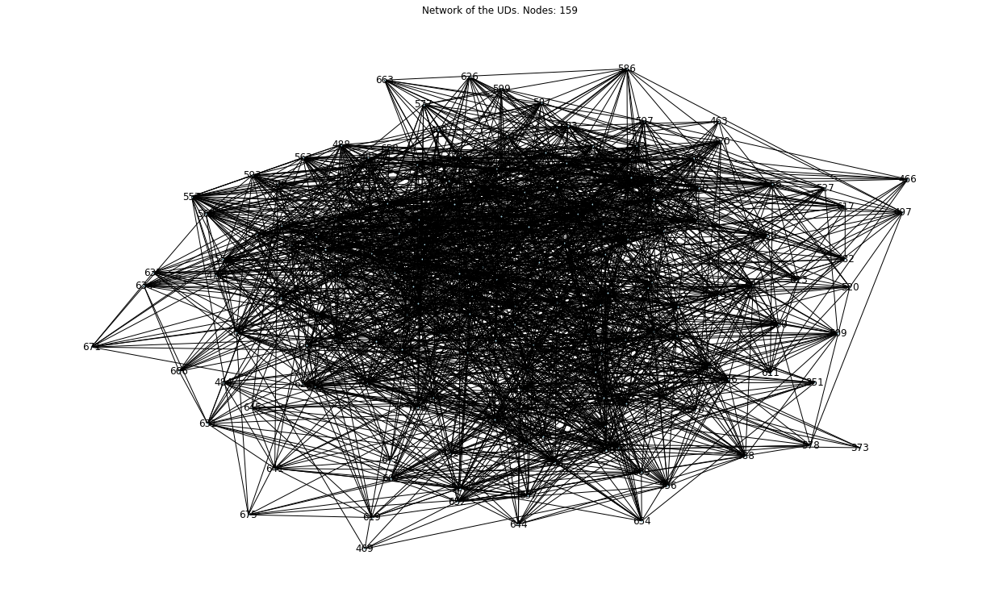

Betweenness Centrality:
{537: 0.024677158386984317, 632: 0.018373125977737943, 665: 0.018347154493827546, 541: 0.017627865954874804, 600: 0.017082680269878584, 553: 0.01685911406106006, 668: 0.016202838059816375, 548: 0.01602366497603924, 569: 0.015466615140876726, 571: 0.015089034984872378}

Closeness Centrality:
{537: 0.5851851851851851, 665: 0.5766423357664233, 620: 0.5745454545454546, 632: 0.5745454545454546, 553: 0.5703971119133574, 595: 0.5703971119133574, 548: 0.5703971119133574, 569: 0.5683453237410072, 601: 0.5683453237410072, 590: 0.5602836879432624}

Degree Centrality:
{537: 0.2974683544303797, 620: 0.27848101265822783, 547: 0.27848101265822783, 632: 0.27848101265822783, 595: 0.2721518987341772, 665: 0.2721518987341772, 524: 0.2721518987341772, 553: 0.26582278481012656, 548: 0.26582278481012656, 590: 0.25949367088607594}

Eigenvector Centrality:
{537: 0.15116972912370022, 665: 0.14499203109065242, 548: 0.13306630395171531, 547: 0.13300276929138463, 524: 0.1295273853183337, 6

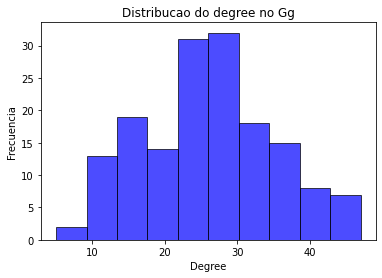

Densidade: 0.16415890454581641
Número de nós: 159
Número de aristas: 2062
Diámetro: 4
Transitividade: 0.4603534130991078
Average shorthest path: 1.970702969508797
Coeficiente de Clustering Promedio (cluster maior): 0.48665503342669497
----------------------------


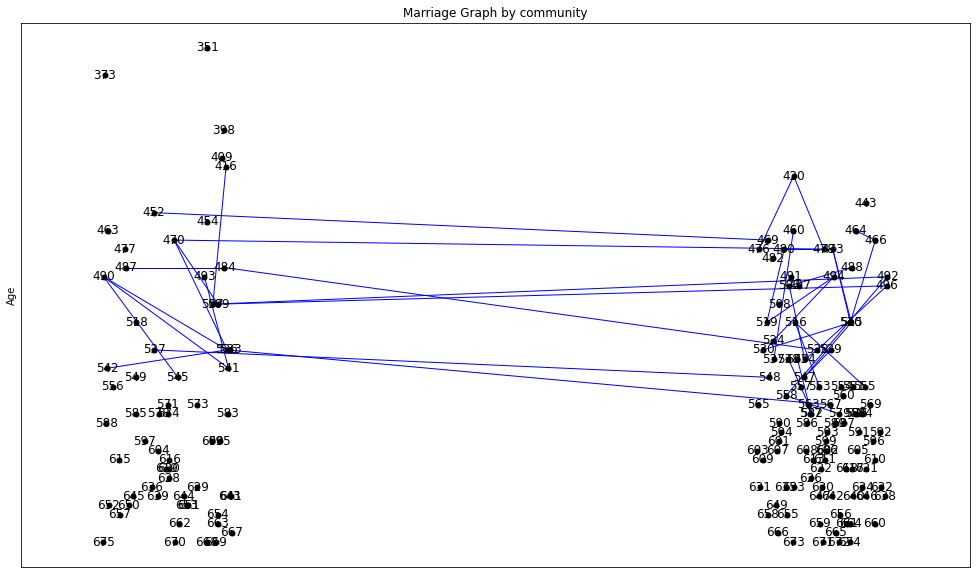

Total de enlaces: 40
Links inside the community '1': 22.50%
Links inside the community '2': 60.00%
Linkgs outside the community '1' and '2': 12.50%
Linkgs outside the community '2' and '1': 5.00%


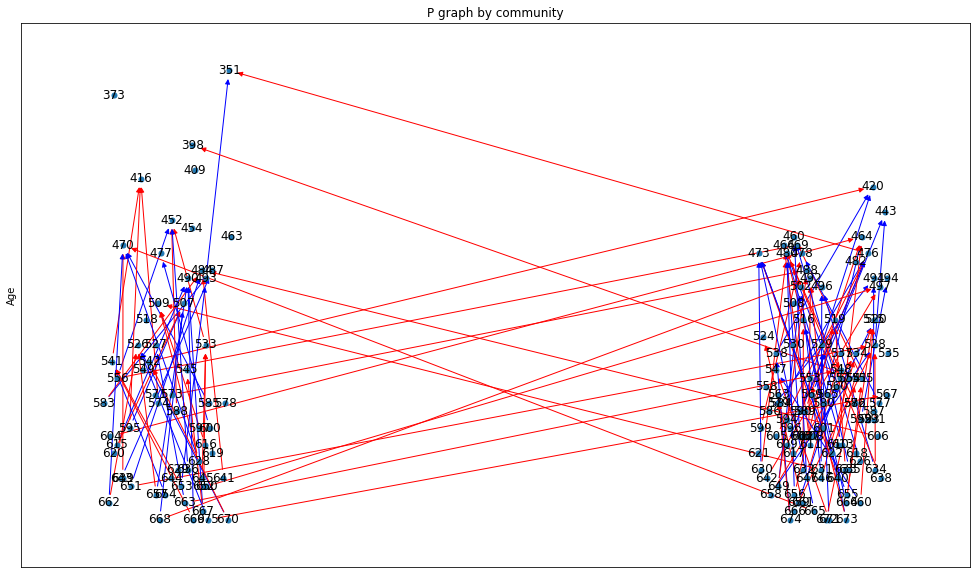

tamos en tiempo 150 con vivas 154


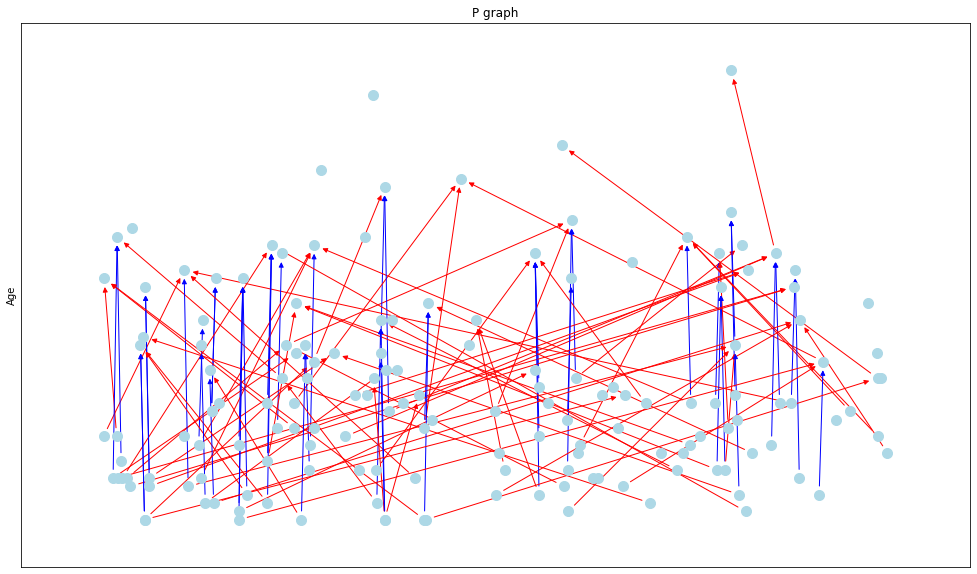

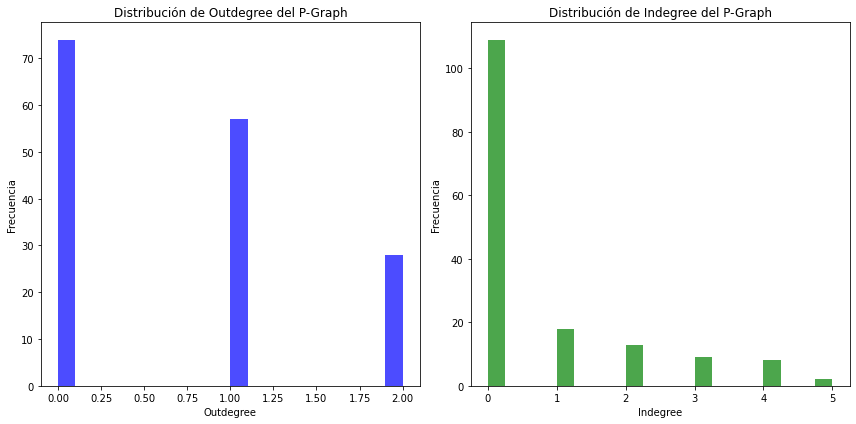

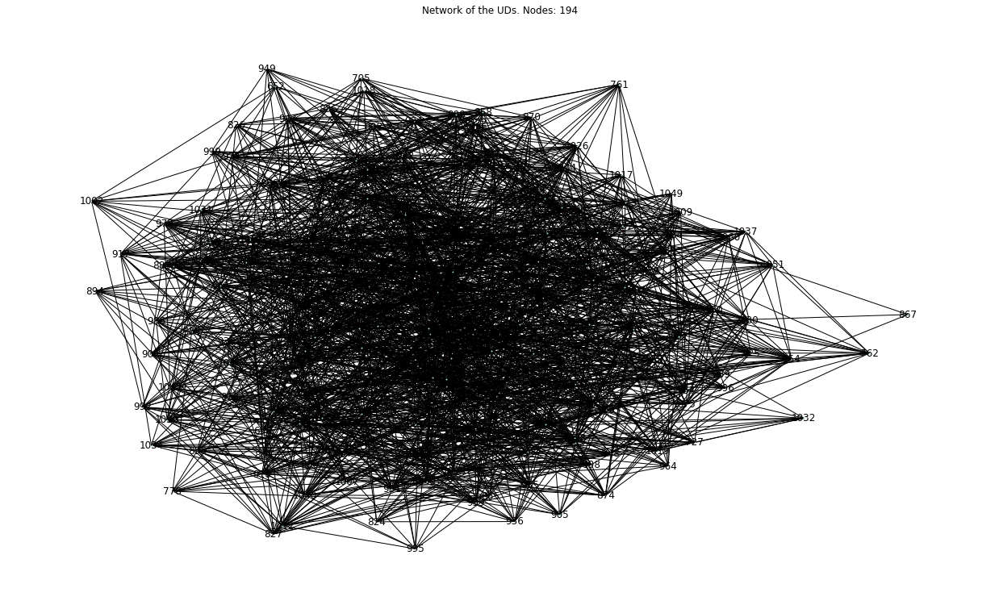

Betweenness Centrality:
{991: 0.024919988766189737, 913: 0.020545018611333666, 853: 0.019006839366910916, 1035: 0.01796843248894539, 828: 0.01757235299593013, 767: 0.014754640458884147, 875: 0.013867456673702367, 1044: 0.013733155387052547, 1028: 0.013443686867822647, 784: 0.01332149122796201}

Closeness Centrality:
{853: 0.5361111111111111, 1035: 0.5273224043715847, 919: 0.5244565217391305, 875: 0.5230352303523035, 913: 0.5230352303523035, 1028: 0.5216216216216216, 933: 0.5202156334231806, 828: 0.5188172043010753, 1025: 0.5188172043010753, 941: 0.516042780748663}

Degree Centrality:
{875: 0.21761658031088082, 1028: 0.19689119170984457, 932: 0.1917098445595855, 1035: 0.1917098445595855, 853: 0.18652849740932642, 941: 0.18652849740932642, 847: 0.18134715025906736, 970: 0.18134715025906736, 991: 0.1761658031088083, 882: 0.1761658031088083}

Eigenvector Centrality:
{875: 0.1265705413199892, 932: 0.12239574497140261, 970: 0.1208789096281796, 1035: 0.12033851266403596, 1028: 0.1198269717629

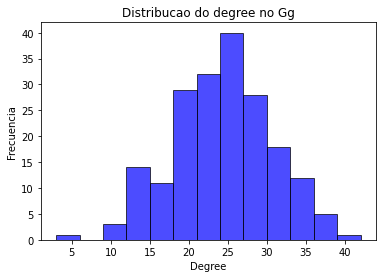

Densidade: 0.12333742855616688
Número de nós: 194
Número de aristas: 2309
Diámetro: 4
Transitividade: 0.43345967386513884
Average shorthest path: 2.1345547780567276
Coeficiente de Clustering Promedio (cluster maior): 0.4536737523701572
----------------------------


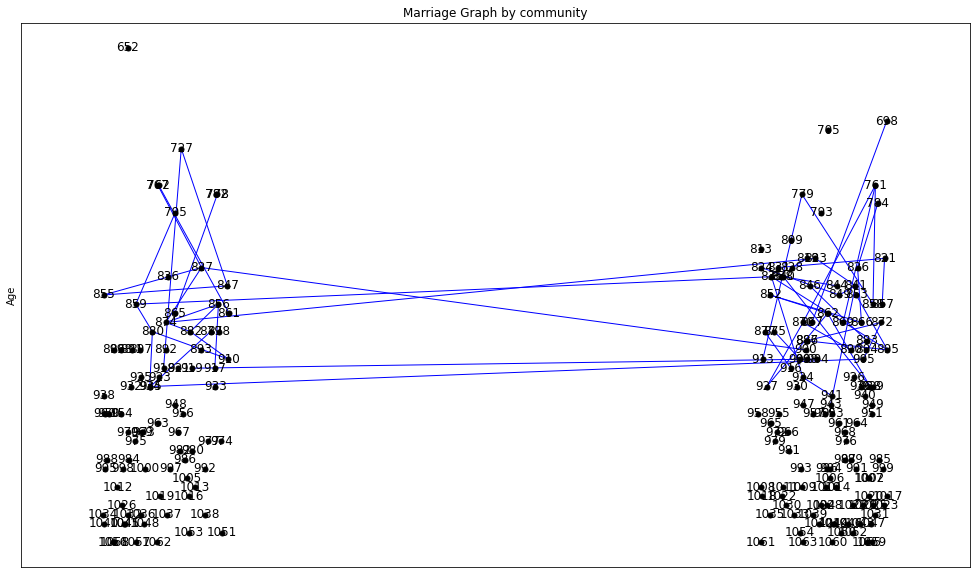

Total de enlaces: 57
Links inside the community '2': 59.65%
Links inside the community '1': 31.58%
Linkgs outside the community '2' and '1': 7.02%
Linkgs outside the community '1' and '2': 1.75%


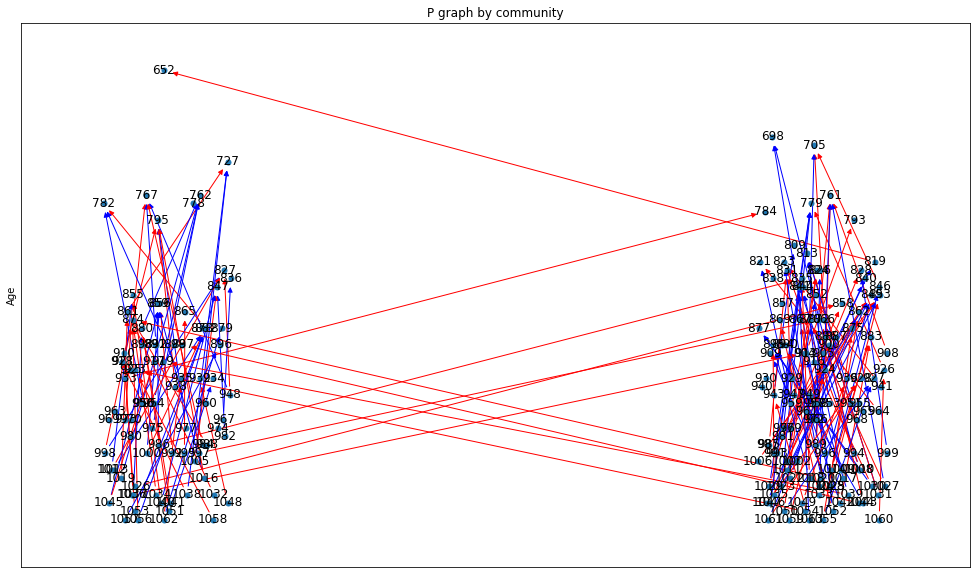

tamos en tiempo 200 con vivas 192


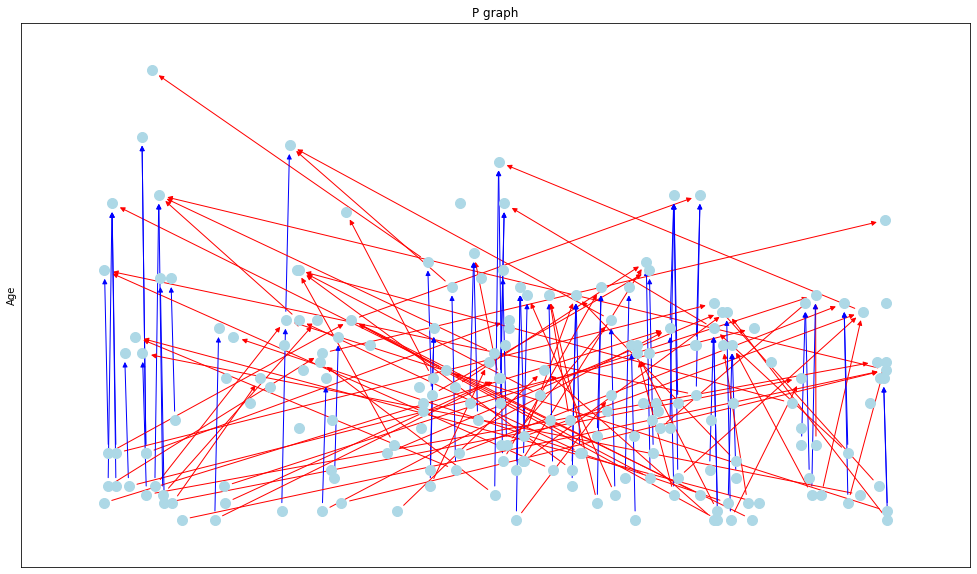

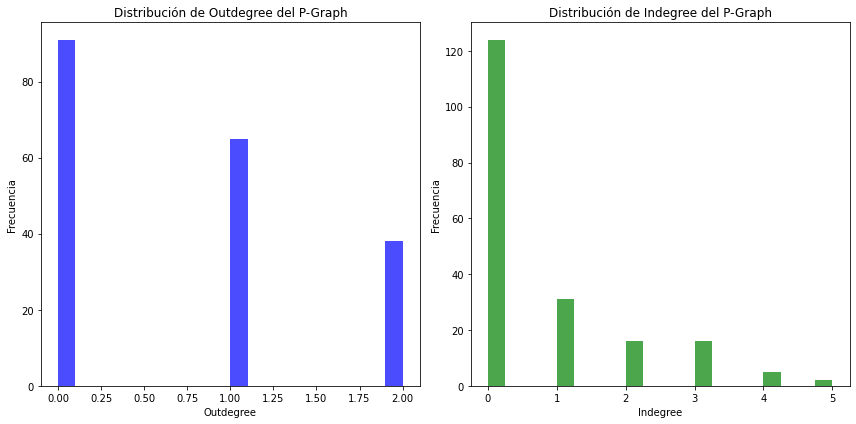

194


In [8]:
#ENDOGAMY 
#Parameters endogamy
iniciais = 50 # Initial UD
communities = (list(range(1, 2 + 1)) * (iniciais // 2)) # Just 2 communities
random.shuffle(communities)
prob_morte = 0.06 # Beta from the gutertz equation
media = 4 # Average children per UD
random.seed(42) # Random seed
t = 201 #steps of the simulation
dataset = [] # For the dataset
#### Initialization endogamy
## Communities
UD_endogamy.uds = {}
instancias_ud = []
for id_ud in range(1, int(iniciais) + 1):
        instancias_ud.append(UD_endogamy(id_ud, media, communities.pop()))
## Varieties
limited_varieties = True
if limited_varieties == False:
    for id_ud, ud in UD_endogamy.uds.items():
        for _ in range(5):
            ud.varieties.append(Variety())
else:
    initial_varieties = [Variety() for _ in range (10)]
    for ud in UD_endogamy.uds.values():
        for _ in range(3):
            ud.varieties.append(random.choice(initial_varieties))
#### Simulation endogamy
vivas = [int(iniciais)]
for i in range (1, (t)):
    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy.uds.items() if ud.activa}
    if not uds_copy:
        print("acabo")
        break
    # Cycle: 
    for id_ud, ud in uds_copy.items():
        ud.ter_filho()
        ud.buscar_ud(media, 50, True)
        ud.incrementar_idade()
        ud.death_probability(prob_morte)
    # Visualizations
    if i % 50 == 0: 
        create_vis_geral(uds_copy, True)
        dataset = general_charactersitics_data(i, uds_copy, dataset, False, False)
        G = marriage_graph_attribute(uds_copy, "community", False)
        # community
        results_community = count_links_between_and_within(G, 'community')
        p_graph_attribute(uds_copy, "community", False)
        print(f"tamos en tiempo {i} con vivas {viv}")
        p_graph(uds_copy, True)

    # Collecting data for population
    viv = len([ud for id, ud in uds_copy.items() if ud.activa])
    vivas.append(viv)        
print(len([ud for id, ud in uds_copy.items() if ud.activa]))
dataset = general_charactersitics_data(i, uds_copy, dataset, True, False)
individuals, families = generate_puck(UD_endogamy.uds)

In [9]:
# Folder
folder_name = 'resultados_puck'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
#Restricted
csv_path = os.path.join(folder_name, 'Endogamy_puck_dataset_individuals.csv')
individuals.to_csv(csv_path, index=False)
csv_path = os.path.join(folder_name, 'Endogamy_puck_dataset_families.csv')
families.to_csv(csv_path, index=False)

,ID,Status,FatherID,MotherID,Children
0,1,M,1.1,1.5,"[57, 61]"
1,2,M,2.1,2.5,"[51, 61, 85, 91, 100]"
2,3,M,3.1,3.5,"[54, 66]"
3,4,M,4.1,4.5,"[62, 90, 97, 98]"
4,5,M,5.1,5.5,"[55, 65, 85]"
...,...,...,...,...,...
990,991,M,991.1,991.5,None
991,992,M,992.1,992.5,None
992,993,M,993.1,993.5,None
993,994,M,994.1,994.5,None
